# TP Coding a GAN in tensorflow/keras

Author : Alasdair Newson

alasdair.newson@telecom-paris.fr

## Objective:

The goal of this TP is to explore GANs applied to the mnist and cifar10 datasets.

We will start with the mnist dataset.

### Your task:
You need to add the missing parts in the code (parts between # --- START CODE HERE and # --- END CODE HERE or # FILL IN CODE)

First of all, let's load some packages

In [8]:

import matplotlib.pyplot as plt
import sys
import numpy as np
import pickle
import copy
import os

import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, BatchNormalization, Activation, ZeroPadding2D,LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras import backend as K

## Loading the data

We define a function to load the mnist or cifar10 datasets. Note, we normalise the data between -1 and 1 here (this is often the case for GANs).

In [9]:
def load_data(dataset_name):
  # Load the dataset
  if(dataset_name == 'mnist'):
    (X_train, _), (_, _) = mnist.load_data()
  elif(dataset_name == 'cifar'):
    from keras.datasets import cifar10
    (X_train, y_train), (X_test, y_test) = cifar10.load_data()
  else:
    print('Error, unknown database')

  # Rescale -1 to 1
  X_train = X_train / 127.5 - 1.
  #add a channel dimension, if need be (for mnist data)
  if(X_train.ndim ==3):
    X_train = np.expand_dims(X_train, axis=3)
  return X_train
		

## Model architecture

Now, we define the model architecture.

For the first dataset, mnist, we are going to use fully connected layers. Implement the following architecture, for the generator and the discriminator :

Generator :
- Dense layer, to size 256
- Leaky ReLU ($\alpha=0.2$)
- Dense layer, to size 256
- Leaky ReLU ($\alpha=0.2$)
- Dense layer, output size 784
- Tanh activation
- Reshape to size $28 \times 28 \times 1$

Discriminator :
- Flatten
- Dense layer, to size 512
- Leaky ReLU ($\alpha=0.2$)
- Dense layer, output size 256
- Leaky ReLU ($\alpha=0.2$)
- Dense layer, output size 1
- Sigmoid activation

In [10]:
def build_generator(z_dim,img_shape,dataset_name):

  model_generator=Sequential()
  z_rand = Input(shape=(z_dim,))

  # BEGIN FILL IN CODE
  # Dense layer, to size 256
  model_generator.add(z_rand)
  model_generator.add(Dense(256))

  # Leaky ReLU ( α=0.2 )
  model_generator.add(LeakyReLU(0.2))

  # Dense layer, to size 256
  model_generator.add(Dense(256))

  # Leaky ReLU ( α=0.2 )
  model_generator.add(LeakyReLU(0.2))

  # Dense layer, output size 784
  model_generator.add(Dense(784))

  # Tanh activation
  model_generator.add(Activation('tanh'))

  # Reshape to size  28×28×1
  model_generator.add(Reshape(img_shape))

  # END FILL IN CODE
  #model_generator = Model(z_rand, output_img)
  model_generator.summary()

  return model_generator


In [11]:

def build_discriminator(img_shape,dataset_name):

  input_img = Input(shape=img_shape)
  
  model_discriminator=Sequential()

  model_discriminator.add(input_img)
	
  # BEGIN FILL IN CODE
  # Flatten
  model_discriminator.add(Flatten())
  # Dense layer, to size 512
  model_discriminator.add(Dense(512))
  # Leaky ReLU ( α=0.2 )
  model_discriminator.add(LeakyReLU(0.2))
  # Dense layer, output size 256
  model_discriminator.add(Dense(256))
  # Leaky ReLU ( α=0.2 )
  model_discriminator.add(LeakyReLU(0.2))
  # Dense layer, output size 1
  model_discriminator.add(Dense(1))
  # Sigmoid activation
  model_discriminator.add(Activation('sigmoid'))
  # END FILL IN CODE

  #model_discriminator = Model(input_img, p_true)
  model_discriminator.summary()

  return model_discriminator


## Loss function


The GAN loss function is the following :
\begin{equation}
	\min_{G} \max_{D} \mathbb{E}_{x \in p_{data}} \left[ \log D(x)\right] +
	\mathbb{E}_{z \in p_{z}}\left[ \log \left( 1 - D(G(z)) \right)\right],
\end{equation}
where $G$ is the generator, $D$ is the discriminator, $z$ is the latent code, which follows a normal distribution.

You should notice that this is extremely similar to the binary cross-entropy function. Therefore, there is an intelligent way to train the discriminator : we give it first a batch of real images, and label them as real, and secondly we give a batch of fake images and label them as fake. Therefore, the discriminator training itself is done in two sequential steps (first true, then fake). If the labels are correctly chosen (further on, during training), you can (and __should__) use the binary cross-entropy function.

The generator loss, however, must be specified as :
- $mean(\log(1-G(z)))$

You can use the ```k.mean``` function for this purpose.


The training is carried out sequentially : first we execute a few training steps on the discriminator, and then one on the generator. Therefore, we use two loops : one to train the discriminator (the internal loop) and one to train the generator (external loop). The GAN training algorithm is as follows :

- For $i=0$ to $n-1$
  - For $j=0$ to $m-1$
    - $x \leftarrow$ random batch of data
    - $z \leftarrow$ random batch of latent codes
    - Train discriminator on real images $x$
    - Train discriminator on fake images $G(z)$
  - $z \leftarrow$ random batch of latent codes
  - Train discriminator on fake images $G(z)$



In [12]:
optimizer = Adam(0.0001, 0.5)
dataset_name = 'mnist'
X_train = load_data(dataset_name)

# default parameters for mnist 
img_rows = X_train.shape[1]
img_cols = X_train.shape[2]
img_channels = X_train.shape[3]
img_shape = (img_rows, img_cols, img_channels)
z_dim = 10

# Build and compile the discriminator
discriminator = build_discriminator(img_shape,dataset_name)
# set discriminator loss
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy']) # FILL IN CODE

# Build the generator
generator = build_generator(z_dim,img_shape,dataset_name)

# Create the stacked model
#first, create the random vector z in the latent space
z = Input(shape=(z_dim,))
#create generated (fake) image
gen_img = generator(z)  # FILL IN CODE

#indicate that for the stacked model, the weights are not trained (we only train the generator in the stacked model)
discriminator.trainable = False

# The discriminator takes generated images as input and gives a probability of whether it is a true or false image
p_true = discriminator(gen_img)  # FILL IN CODE

# The combined model  (stacked generator and discriminator)
# In this model, we train the generator only
stacked_gen_disc = Model(z, p_true)

# generator loss
generator_loss = K.mean(K.log(1-discriminator(generator(z)))) # FILL IN CODE
# create stacked model loss
stacked_gen_disc.add_loss(generator_loss)
stacked_gen_disc.compile(optimizer=optimizer)

	

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dense_6 (Dense)             (None, 512)               401920    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_8 (Dense)             (None, 1)                 257       
                                                                 
 activation_2 (Activation)   (None, 1)                

### Sampling function

We now create a function to sample several images during training (to follow the convergence of the network)

In [13]:

def sample_images(generator,z_dim, rand_seed=30):
  #np.random.seed(rand_seed)
  r, c = 5, 5
  z_random = np.random.normal(0, 1, (r * c, z_dim))
  gen_imgs = generator.predict(z_random)

  # Rescale images 0 - 1
  gen_imgs = 0.5 * gen_imgs + 0.5

  fig, axs = plt.subplots(r, c)
  cnt = 0
  for i in range(r):
    for j in range(c):
      #black and white images
      if(gen_imgs.shape[3] == 1):
        axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
      elif(gen_imgs.shape[3] == 3):   #colour images
        axs[i,j].imshow(gen_imgs[cnt, :,:])
      else:
        print('Error, unsupported channel size. Dude, I don''t know what you want me to do.\
            I can''t handle this data. You''ve made me very sad ...')
      axs[i,j].axis('off')
      cnt += 1
  plt.show()

## Training

We are now ready to train the network. Here is the training algorithm again :

- For $i=0$ to $n-1$
  - For $j=0$ to $m-1$
    - $x \leftarrow$ random batch of data
    - $z \leftarrow$ random batch of latent codes
    - Train discriminator on real images $x$
    - Train discriminator on fake images $G(z)$
  - $z \leftarrow$ random batch of latent codes
  - Train discriminator on fake images $G(z)$

You can use ```np.random.normal``` to create a batch of random latent codes, and ```np.random.randint``` to create a batch of random images.

You can then train the discriminator and the generator using the ```train_on_batch``` function.

We do not worry here about looping over the whole database : just create a random batch at each iteration.

2/2 [==============================] - 0s 6ms/step
0 [D loss: 0.523200, acc.: 53.12%] [G loss: -0.714244]
1/1 [==============================] - 0s 56ms/step


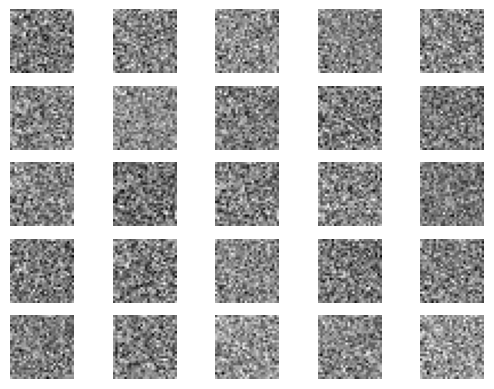

2/2 [==============================] - 0s 4ms/step
100 [D loss: 0.566284, acc.: 50.00%] [G loss: -0.461314]
1/1 [==============================] - 0s 15ms/step


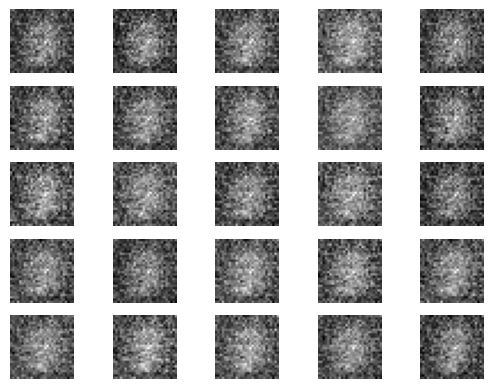

2/2 [==============================] - 0s 9ms/step
200 [D loss: 0.251129, acc.: 98.44%] [G loss: -0.224415]
1/1 [==============================] - 0s 19ms/step


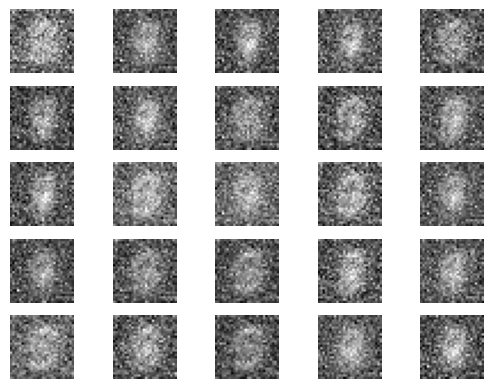

2/2 [==============================] - 0s 6ms/step
300 [D loss: 0.199599, acc.: 98.44%] [G loss: -0.160137]
1/1 [==============================] - 0s 17ms/step


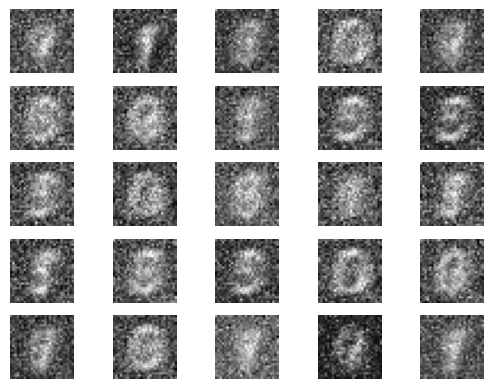

2/2 [==============================] - 0s 13ms/step
400 [D loss: 0.086732, acc.: 100.00%] [G loss: -0.042455]
1/1 [==============================] - 0s 25ms/step


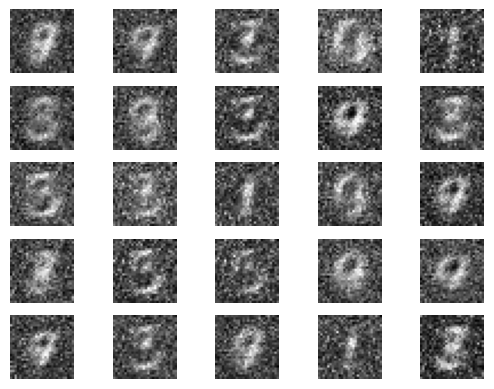

2/2 [==============================] - 0s 5ms/step
500 [D loss: 0.184120, acc.: 96.09%] [G loss: -0.060394]
1/1 [==============================] - 0s 17ms/step


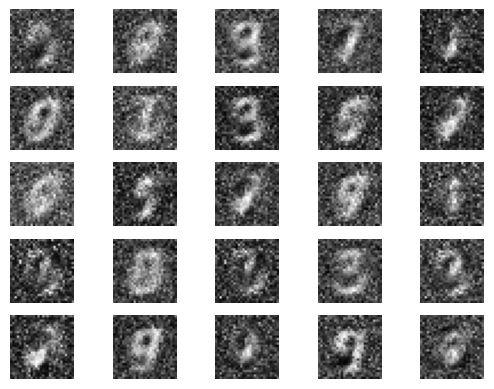

2/2 [==============================] - 0s 4ms/step
600 [D loss: 0.189563, acc.: 95.31%] [G loss: -0.025192]
1/1 [==============================] - 0s 28ms/step


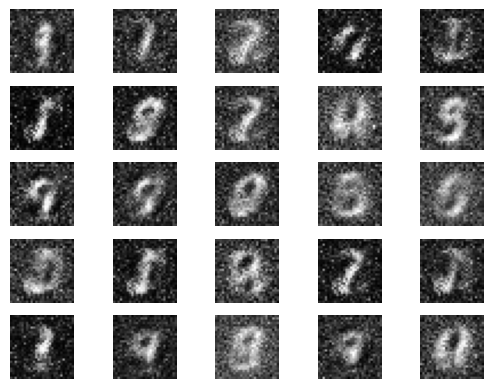

2/2 [==============================] - 0s 4ms/step
700 [D loss: 0.150302, acc.: 96.88%] [G loss: -0.055070]
1/1 [==============================] - 0s 21ms/step


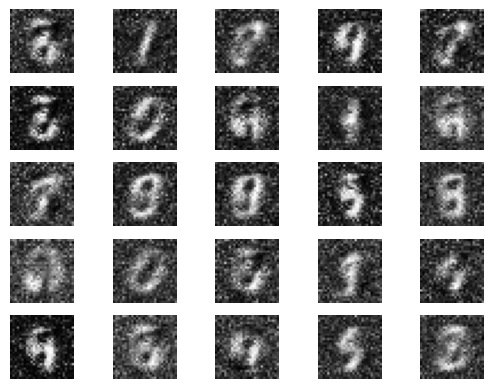

2/2 [==============================] - 0s 4ms/step
800 [D loss: 0.021452, acc.: 100.00%] [G loss: -0.010406]
1/1 [==============================] - 0s 27ms/step


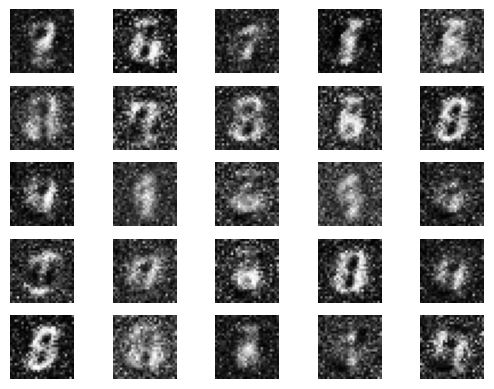

2/2 [==============================] - 0s 7ms/step
900 [D loss: 0.186417, acc.: 92.97%] [G loss: -0.042184]
1/1 [==============================] - 0s 21ms/step


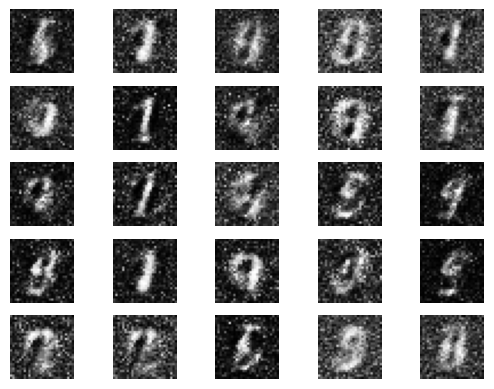

2/2 [==============================] - 0s 6ms/step
1000 [D loss: 0.120145, acc.: 96.88%] [G loss: -0.024404]
1/1 [==============================] - 0s 49ms/step


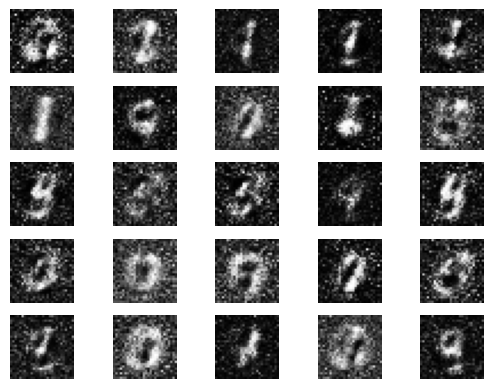

2/2 [==============================] - 0s 4ms/step
1100 [D loss: 0.265439, acc.: 89.84%] [G loss: -0.007377]
1/1 [==============================] - 0s 26ms/step


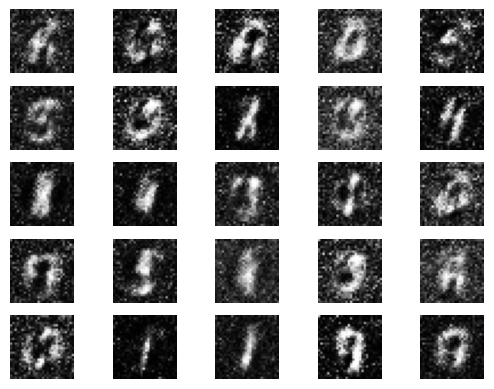

2/2 [==============================] - 0s 5ms/step
1200 [D loss: 0.139220, acc.: 96.88%] [G loss: -0.034695]
1/1 [==============================] - 0s 25ms/step


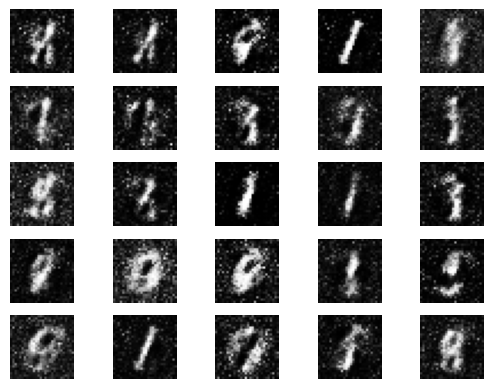

2/2 [==============================] - 0s 6ms/step
1300 [D loss: 0.215379, acc.: 90.62%] [G loss: -0.069590]
1/1 [==============================] - 0s 25ms/step


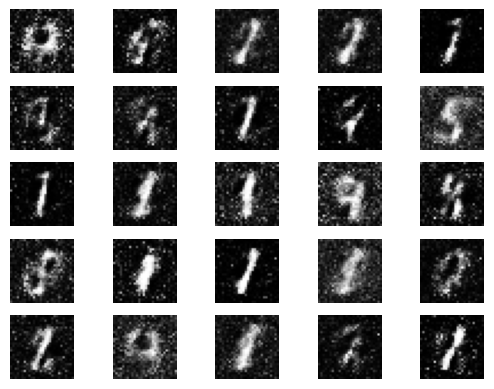

2/2 [==============================] - 0s 3ms/step
1400 [D loss: 0.204163, acc.: 94.53%] [G loss: -0.107231]
1/1 [==============================] - 0s 43ms/step


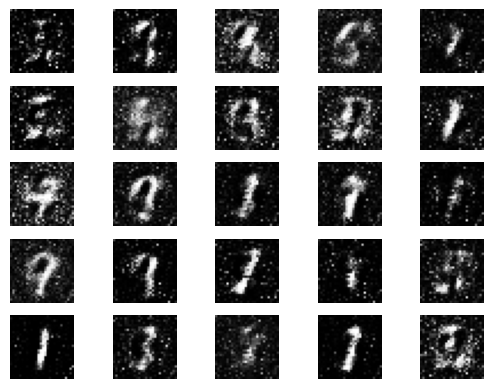

2/2 [==============================] - 0s 7ms/step
1500 [D loss: 0.301713, acc.: 89.84%] [G loss: -0.067017]
1/1 [==============================] - 0s 28ms/step


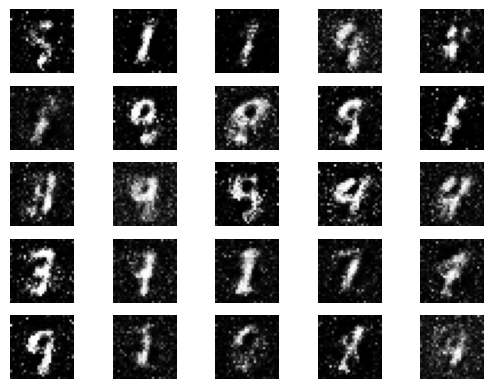

2/2 [==============================] - 0s 4ms/step
1600 [D loss: 0.167163, acc.: 95.31%] [G loss: -0.053422]
1/1 [==============================] - 0s 31ms/step


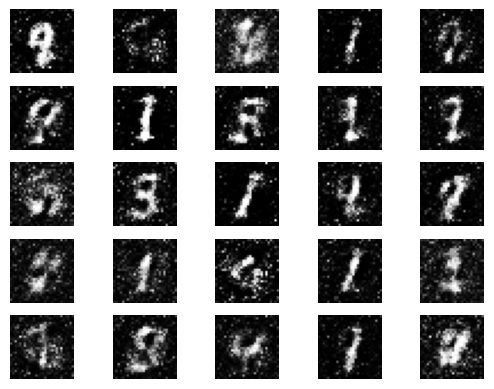

2/2 [==============================] - 0s 4ms/step
1700 [D loss: 0.192361, acc.: 93.75%] [G loss: -0.075217]
1/1 [==============================] - 0s 23ms/step


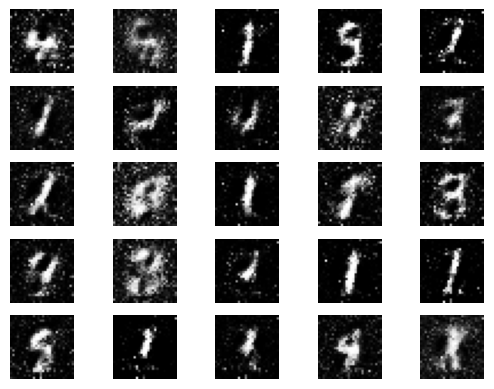

2/2 [==============================] - 0s 3ms/step
1800 [D loss: 0.363982, acc.: 85.94%] [G loss: -0.080757]
1/1 [==============================] - 0s 23ms/step


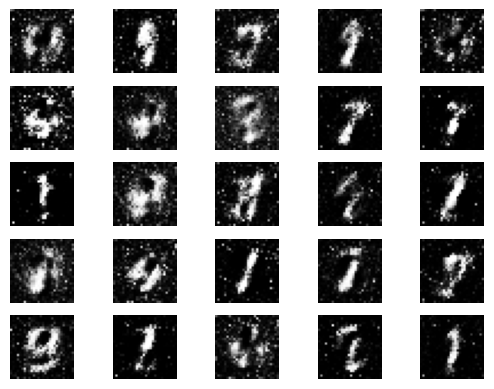

2/2 [==============================] - 0s 4ms/step
1900 [D loss: 0.155402, acc.: 95.31%] [G loss: -0.033453]
1/1 [==============================] - 0s 42ms/step


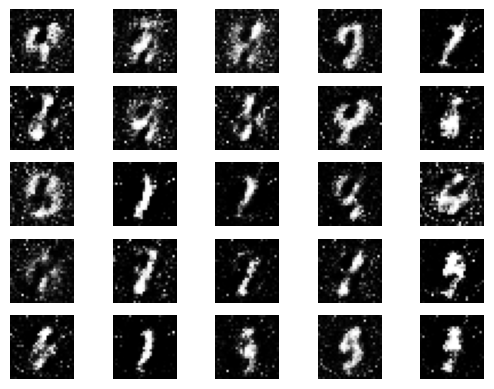

2/2 [==============================] - 0s 3ms/step
2000 [D loss: 0.175219, acc.: 92.19%] [G loss: -0.043181]
1/1 [==============================] - 0s 23ms/step


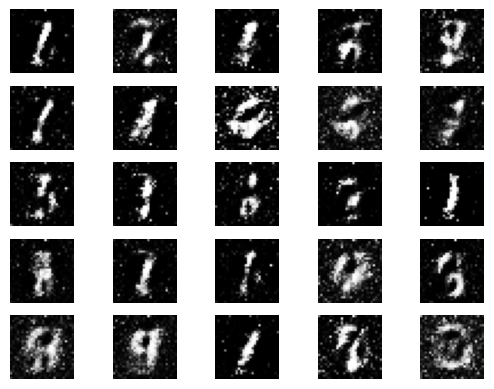

2/2 [==============================] - 0s 5ms/step
2100 [D loss: 0.171909, acc.: 95.31%] [G loss: -0.053078]
1/1 [==============================] - 0s 57ms/step


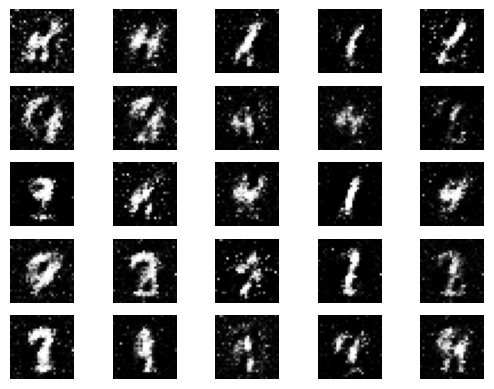

2/2 [==============================] - 0s 6ms/step
2200 [D loss: 0.114100, acc.: 97.66%] [G loss: -0.044053]
1/1 [==============================] - 0s 23ms/step


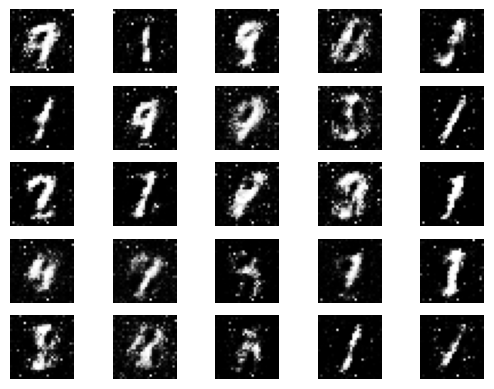

2/2 [==============================] - 0s 3ms/step
2300 [D loss: 0.191434, acc.: 93.75%] [G loss: -0.033093]
1/1 [==============================] - 0s 23ms/step


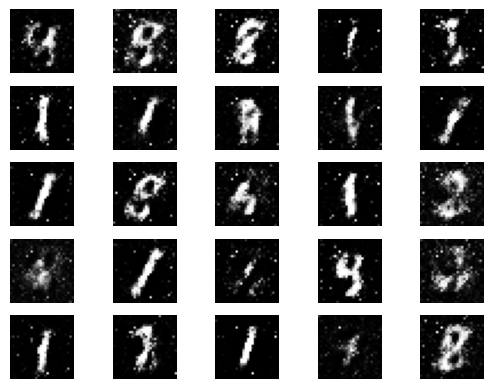

2/2 [==============================] - 0s 3ms/step
2400 [D loss: 0.288193, acc.: 89.06%] [G loss: -0.103354]
1/1 [==============================] - 0s 35ms/step


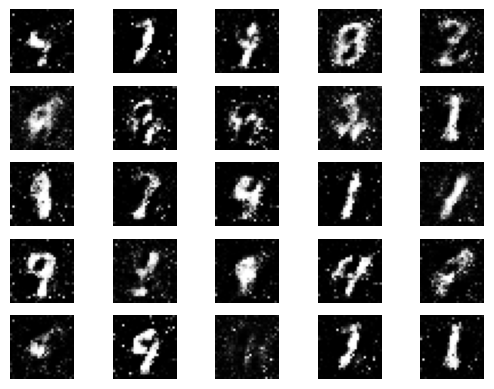

2/2 [==============================] - 0s 5ms/step
2500 [D loss: 0.220558, acc.: 93.75%] [G loss: -0.124980]
1/1 [==============================] - 0s 26ms/step


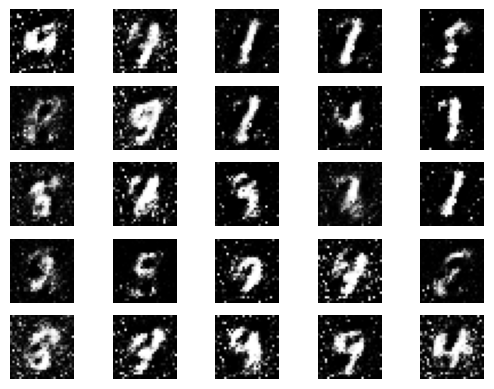

2/2 [==============================] - 0s 3ms/step
2600 [D loss: 0.184634, acc.: 93.75%] [G loss: -0.056060]
1/1 [==============================] - 0s 65ms/step


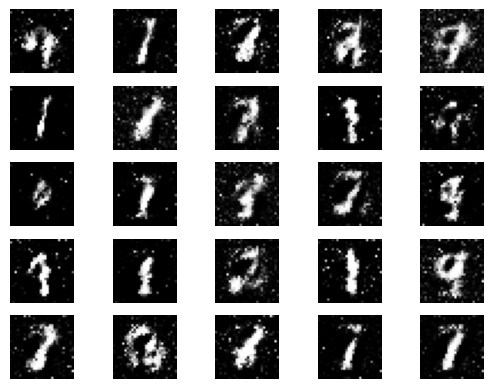

2/2 [==============================] - 0s 3ms/step
2700 [D loss: 0.363188, acc.: 83.59%] [G loss: -0.068399]
1/1 [==============================] - 0s 23ms/step


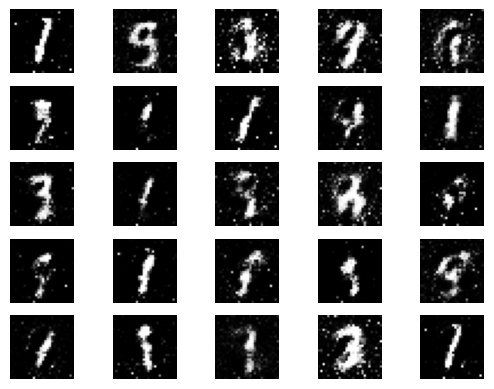

2/2 [==============================] - 0s 6ms/step
2800 [D loss: 0.309692, acc.: 89.06%] [G loss: -0.084510]
1/1 [==============================] - 0s 26ms/step


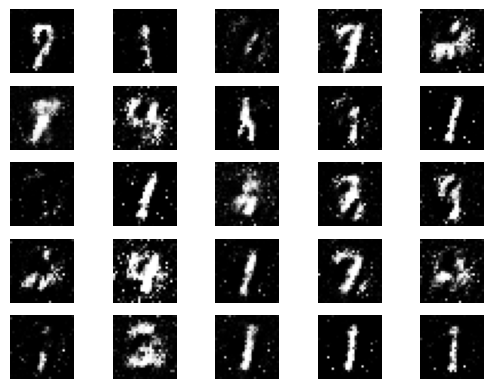

2/2 [==============================] - 0s 4ms/step
2900 [D loss: 0.391546, acc.: 81.25%] [G loss: -0.079768]
1/1 [==============================] - 0s 26ms/step


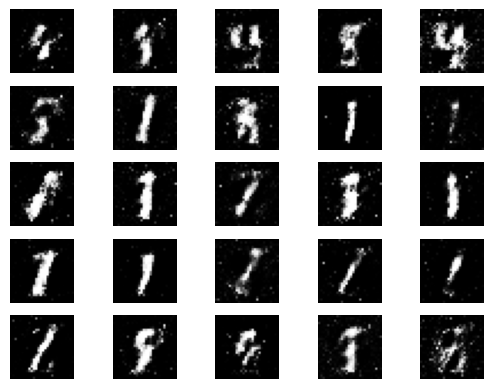

2/2 [==============================] - 0s 6ms/step
3000 [D loss: 0.197792, acc.: 92.19%] [G loss: -0.049481]
1/1 [==============================] - 0s 27ms/step


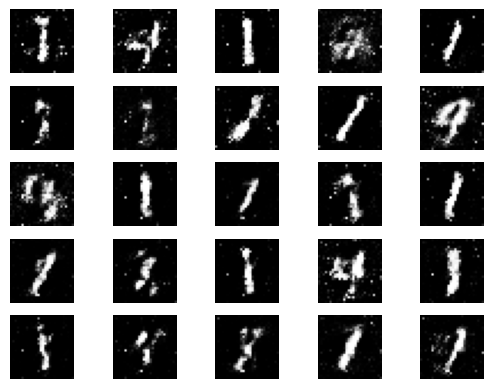

2/2 [==============================] - 0s 3ms/step
3100 [D loss: 0.181415, acc.: 92.97%] [G loss: -0.114979]
1/1 [==============================] - 0s 43ms/step


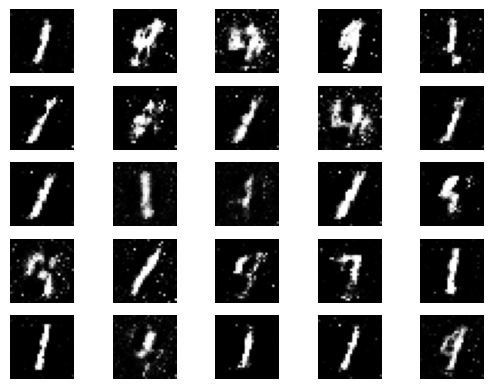

2/2 [==============================] - 0s 5ms/step
3200 [D loss: 0.289093, acc.: 85.94%] [G loss: -0.077803]
1/1 [==============================] - 0s 24ms/step


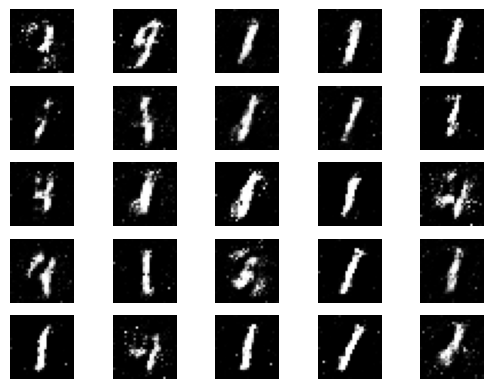

2/2 [==============================] - 0s 4ms/step
3300 [D loss: 0.345928, acc.: 86.72%] [G loss: -0.123889]
1/1 [==============================] - 0s 24ms/step


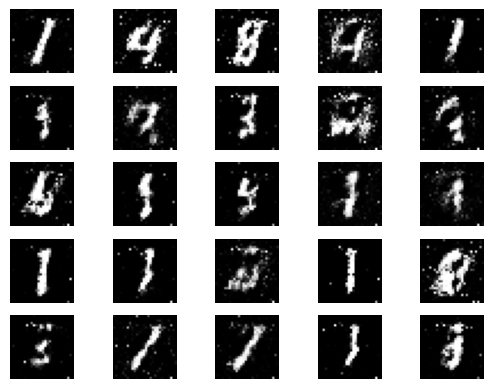

2/2 [==============================] - 0s 6ms/step
3400 [D loss: 0.302522, acc.: 89.06%] [G loss: -0.124962]
1/1 [==============================] - 0s 25ms/step


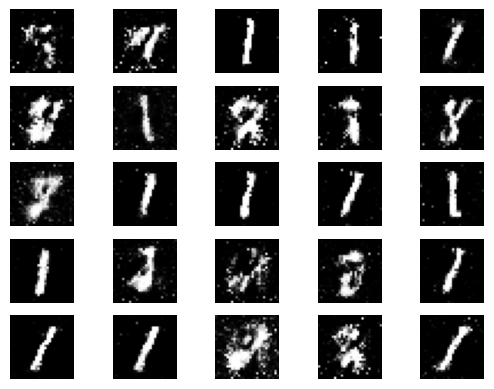

2/2 [==============================] - 0s 5ms/step
3500 [D loss: 0.325987, acc.: 86.72%] [G loss: -0.066836]
1/1 [==============================] - 0s 23ms/step


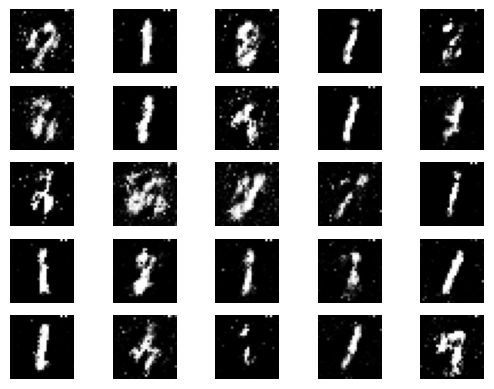

2/2 [==============================] - 0s 5ms/step
3600 [D loss: 0.196583, acc.: 92.97%] [G loss: -0.048724]
1/1 [==============================] - 0s 35ms/step


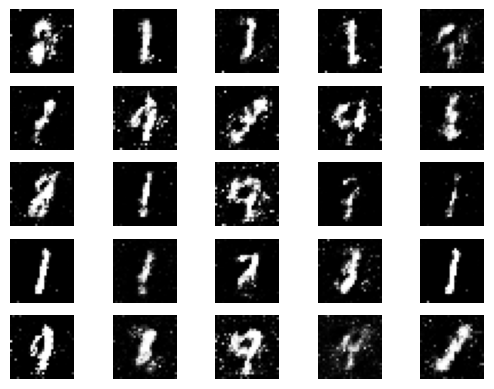

2/2 [==============================] - 0s 3ms/step
3700 [D loss: 0.210490, acc.: 92.19%] [G loss: -0.052714]
1/1 [==============================] - 0s 27ms/step


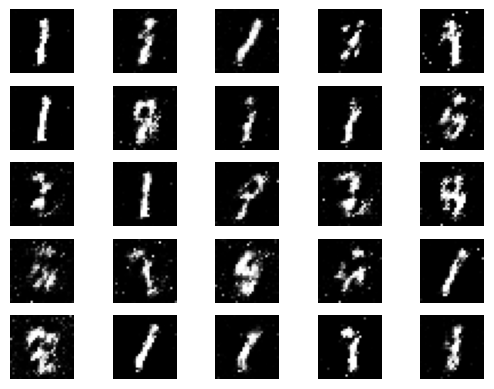

2/2 [==============================] - 0s 10ms/step
3800 [D loss: 0.306547, acc.: 87.50%] [G loss: -0.065354]
1/1 [==============================] - 0s 30ms/step


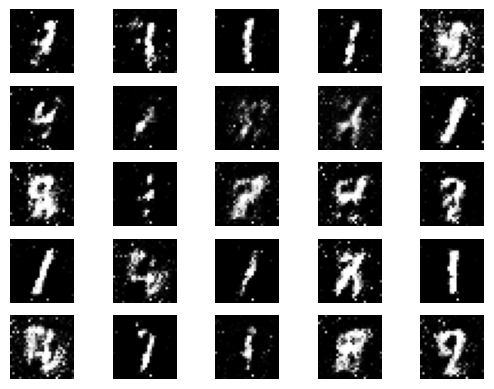

2/2 [==============================] - 0s 6ms/step
3900 [D loss: 0.230128, acc.: 89.84%] [G loss: -0.081208]
1/1 [==============================] - 0s 26ms/step


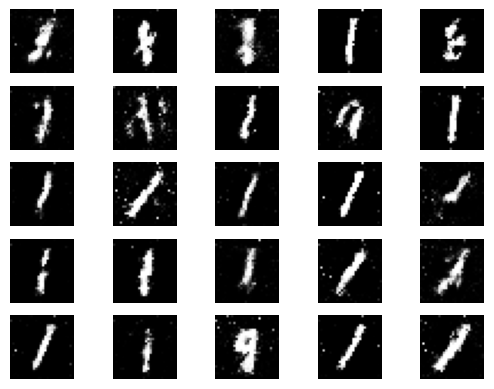

2/2 [==============================] - 0s 3ms/step
4000 [D loss: 0.278557, acc.: 86.72%] [G loss: -0.078074]
1/1 [==============================] - 0s 33ms/step


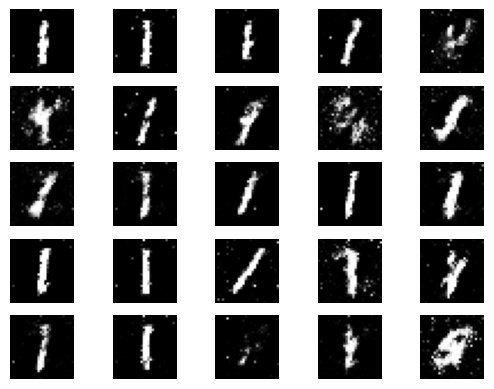

2/2 [==============================] - 0s 6ms/step
4100 [D loss: 0.230101, acc.: 89.84%] [G loss: -0.057473]
1/1 [==============================] - 0s 35ms/step


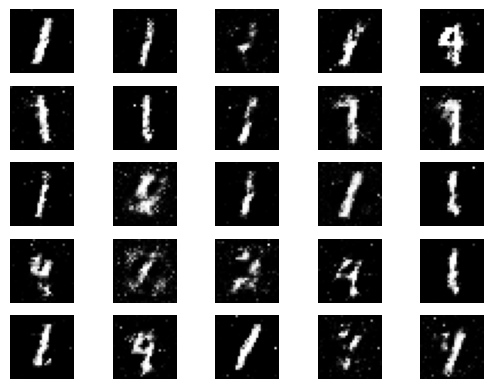

2/2 [==============================] - 0s 7ms/step
4200 [D loss: 0.166073, acc.: 92.97%] [G loss: -0.083664]
1/1 [==============================] - 0s 25ms/step


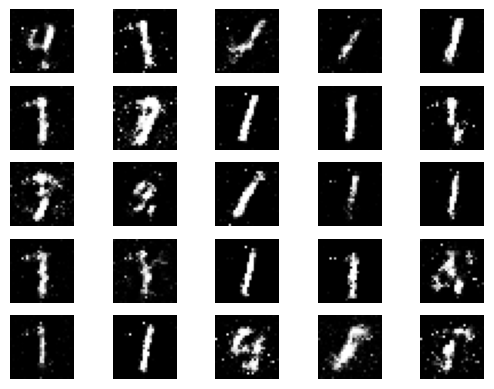

2/2 [==============================] - 0s 5ms/step
4300 [D loss: 0.285905, acc.: 89.06%] [G loss: -0.124027]
1/1 [==============================] - 0s 40ms/step


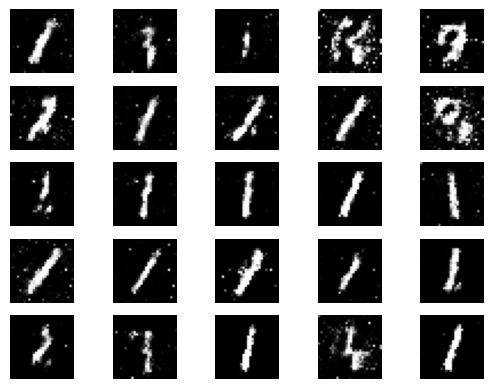

2/2 [==============================] - 0s 3ms/step
4400 [D loss: 0.215565, acc.: 90.62%] [G loss: -0.053670]
1/1 [==============================] - 0s 37ms/step


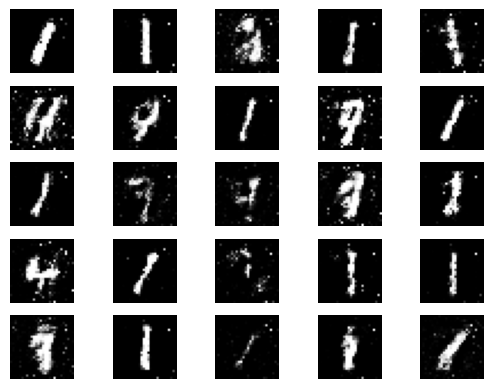

2/2 [==============================] - 0s 3ms/step
4500 [D loss: 0.234948, acc.: 90.62%] [G loss: -0.082884]
1/1 [==============================] - 0s 22ms/step


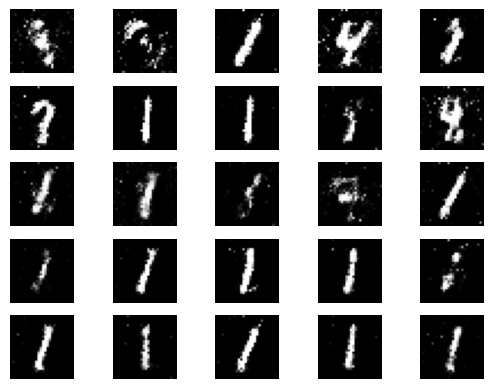

2/2 [==============================] - 0s 6ms/step
4600 [D loss: 0.246453, acc.: 90.62%] [G loss: -0.076635]
1/1 [==============================] - 0s 25ms/step


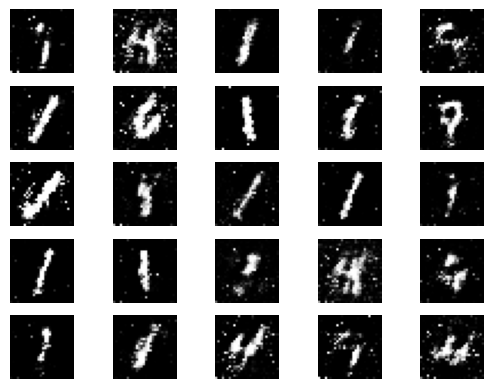

2/2 [==============================] - 0s 4ms/step
4700 [D loss: 0.241928, acc.: 89.84%] [G loss: -0.068658]
1/1 [==============================] - 0s 23ms/step


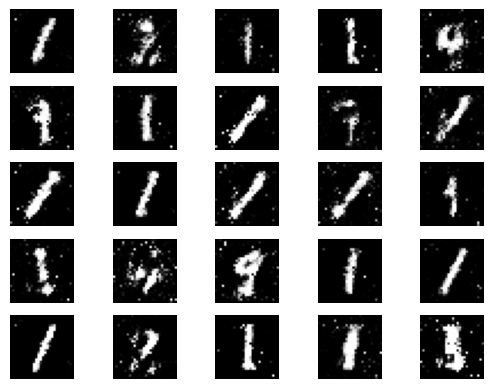

2/2 [==============================] - 0s 4ms/step
4800 [D loss: 0.227943, acc.: 91.41%] [G loss: -0.091787]
1/1 [==============================] - 0s 34ms/step


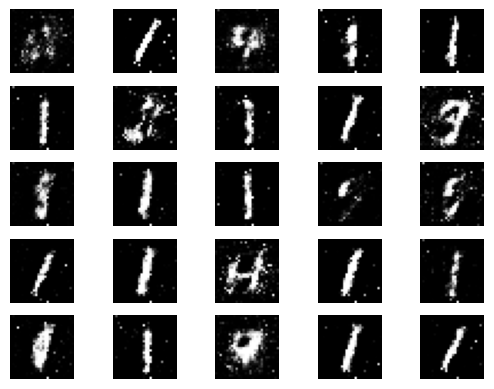

2/2 [==============================] - 0s 3ms/step
4900 [D loss: 0.247108, acc.: 89.84%] [G loss: -0.079855]
1/1 [==============================] - 0s 24ms/step


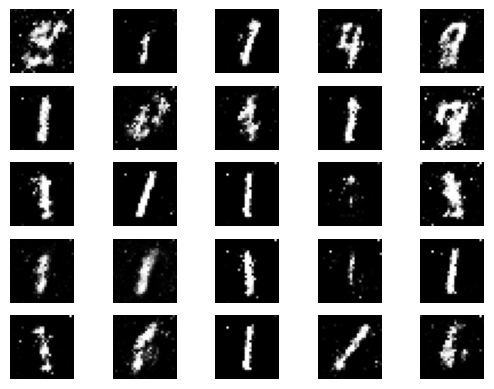

2/2 [==============================] - 0s 6ms/step
5000 [D loss: 0.216474, acc.: 90.62%] [G loss: -0.092993]
1/1 [==============================] - 0s 30ms/step


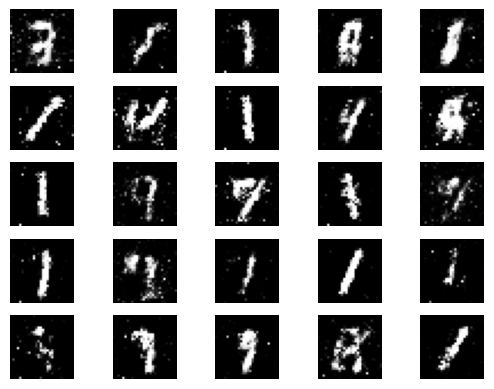

2/2 [==============================] - 0s 3ms/step
5100 [D loss: 0.335551, acc.: 86.72%] [G loss: -0.070704]
1/1 [==============================] - 0s 26ms/step


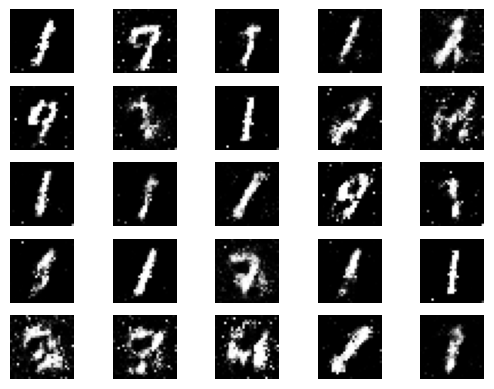

2/2 [==============================] - 0s 4ms/step
5200 [D loss: 0.263991, acc.: 89.06%] [G loss: -0.078021]
1/1 [==============================] - 0s 29ms/step


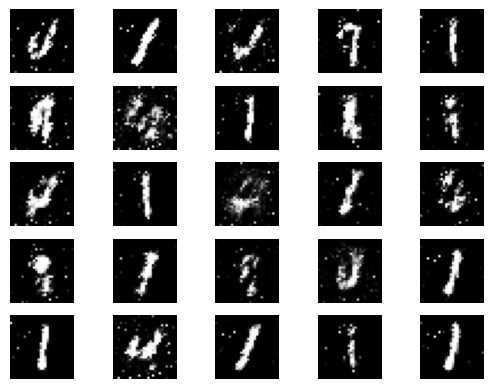

2/2 [==============================] - 0s 7ms/step
5300 [D loss: 0.290884, acc.: 85.16%] [G loss: -0.051438]
1/1 [==============================] - 0s 25ms/step


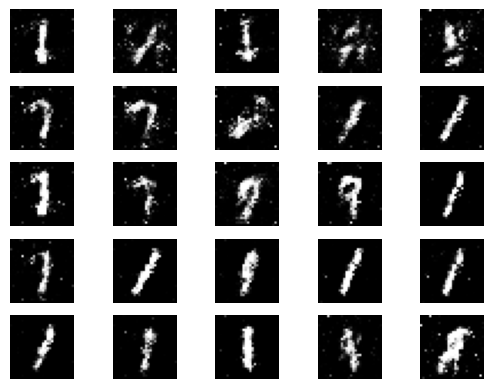

2/2 [==============================] - 0s 7ms/step
5400 [D loss: 0.204521, acc.: 92.97%] [G loss: -0.130650]
1/1 [==============================] - 0s 24ms/step


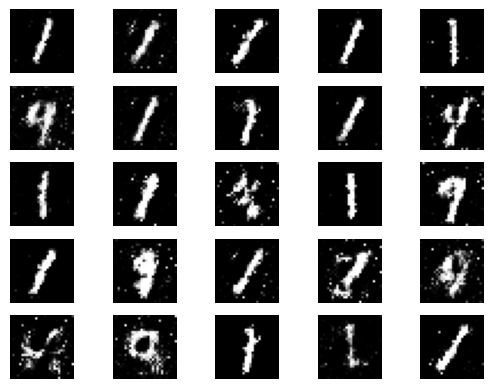

2/2 [==============================] - 0s 3ms/step
5500 [D loss: 0.223161, acc.: 92.97%] [G loss: -0.080036]
1/1 [==============================] - 0s 27ms/step


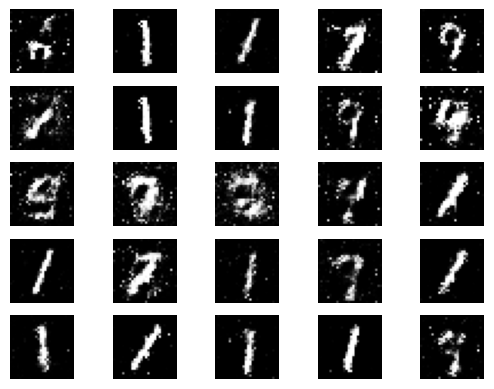

2/2 [==============================] - 0s 6ms/step
5600 [D loss: 0.241416, acc.: 92.97%] [G loss: -0.106953]
1/1 [==============================] - 0s 24ms/step


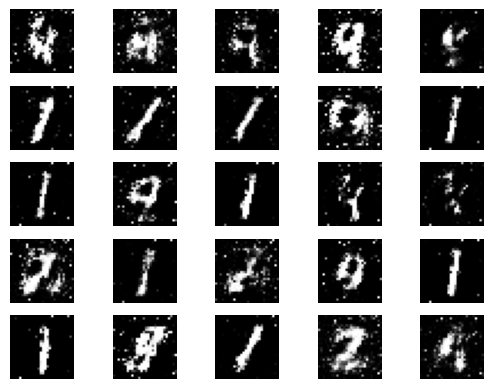

2/2 [==============================] - 0s 5ms/step
5700 [D loss: 0.434798, acc.: 81.25%] [G loss: -0.131674]
1/1 [==============================] - 0s 29ms/step


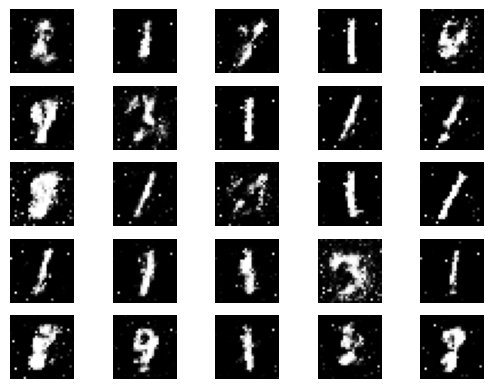

2/2 [==============================] - 0s 3ms/step
5800 [D loss: 0.170494, acc.: 94.53%] [G loss: -0.071123]
1/1 [==============================] - 0s 22ms/step


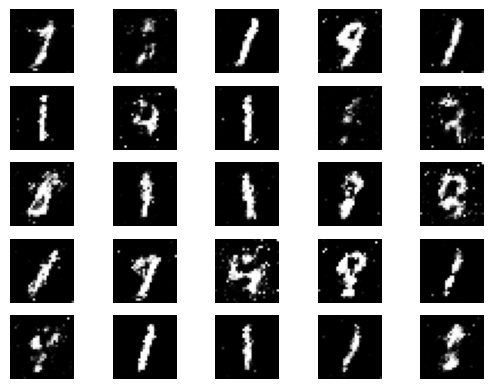

2/2 [==============================] - 0s 4ms/step
5900 [D loss: 0.231120, acc.: 89.06%] [G loss: -0.064599]
1/1 [==============================] - 0s 24ms/step


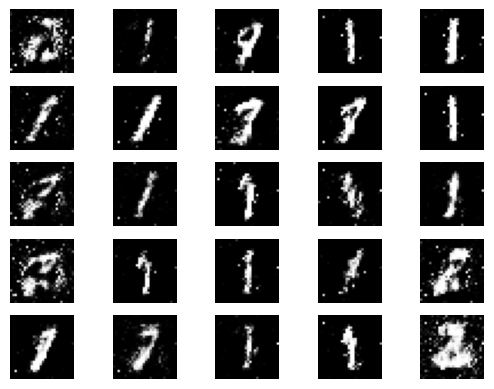

2/2 [==============================] - 0s 4ms/step
6000 [D loss: 0.261461, acc.: 89.84%] [G loss: -0.087169]
1/1 [==============================] - 0s 32ms/step


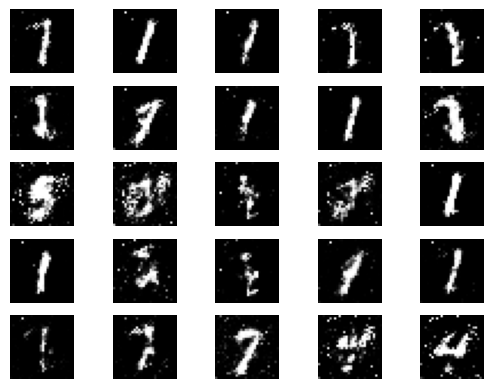

2/2 [==============================] - 0s 5ms/step
6100 [D loss: 0.228484, acc.: 89.84%] [G loss: -0.076327]
1/1 [==============================] - 0s 22ms/step


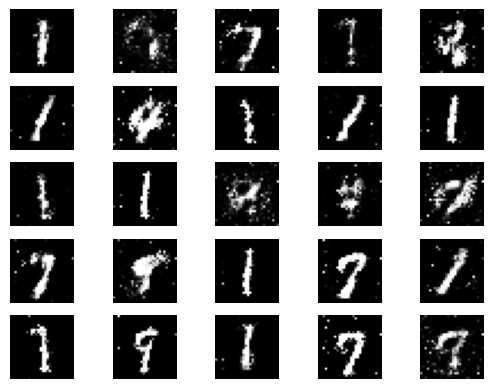

2/2 [==============================] - 0s 3ms/step
6200 [D loss: 0.176352, acc.: 93.75%] [G loss: -0.068159]
1/1 [==============================] - 0s 32ms/step


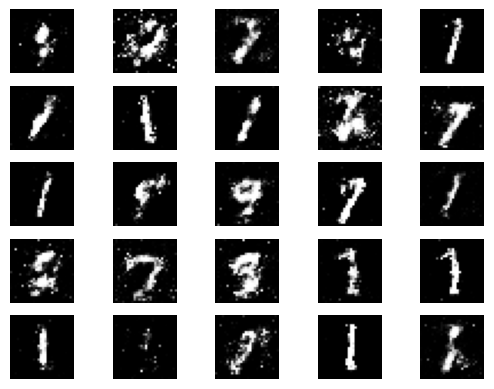

2/2 [==============================] - 0s 4ms/step
6300 [D loss: 0.234424, acc.: 89.84%] [G loss: -0.070494]
1/1 [==============================] - 0s 27ms/step


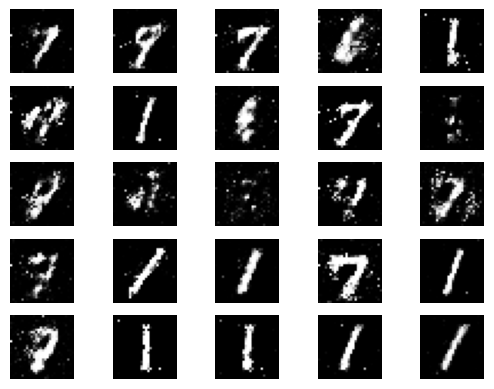

2/2 [==============================] - 0s 3ms/step
6400 [D loss: 0.287402, acc.: 89.84%] [G loss: -0.102586]
1/1 [==============================] - 0s 34ms/step


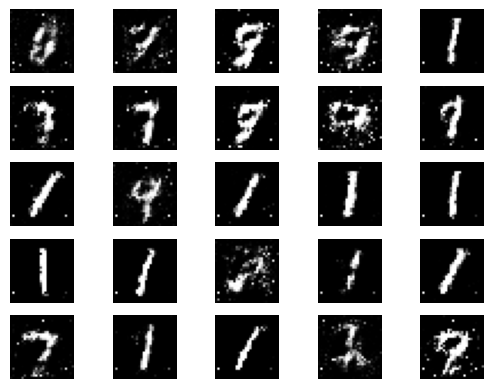

2/2 [==============================] - 0s 7ms/step
6500 [D loss: 0.188796, acc.: 94.53%] [G loss: -0.071140]
1/1 [==============================] - 0s 38ms/step


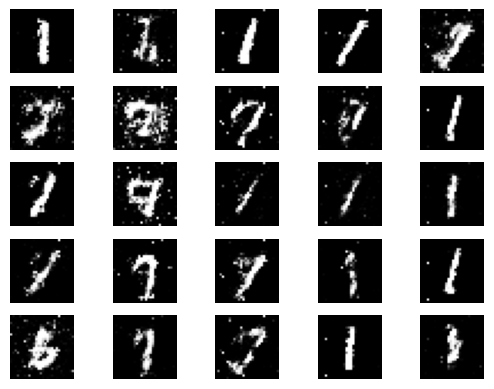

2/2 [==============================] - 0s 6ms/step
6600 [D loss: 0.220074, acc.: 92.19%] [G loss: -0.130471]
1/1 [==============================] - 0s 23ms/step


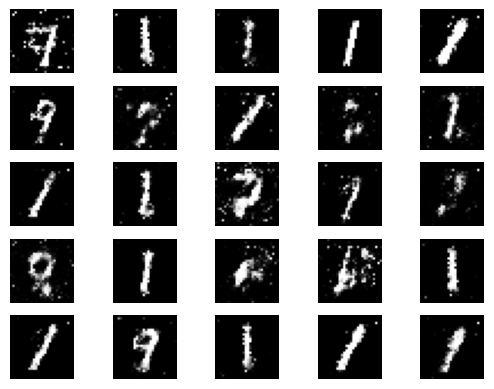

2/2 [==============================] - 0s 3ms/step
6700 [D loss: 0.181294, acc.: 92.97%] [G loss: -0.104787]
1/1 [==============================] - 0s 25ms/step


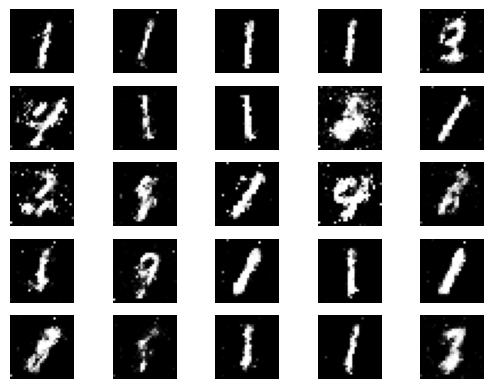

2/2 [==============================] - 0s 4ms/step
6800 [D loss: 0.254899, acc.: 90.62%] [G loss: -0.058639]
1/1 [==============================] - 0s 32ms/step


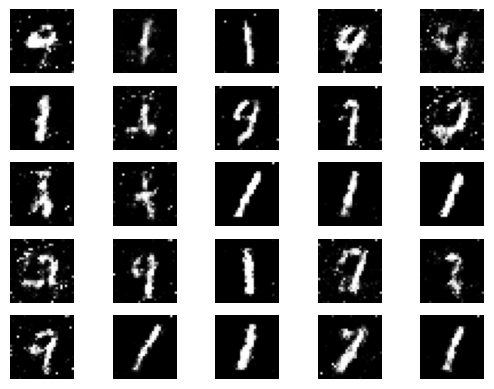

2/2 [==============================] - 0s 3ms/step
6900 [D loss: 0.228116, acc.: 89.06%] [G loss: -0.062387]
1/1 [==============================] - 0s 24ms/step


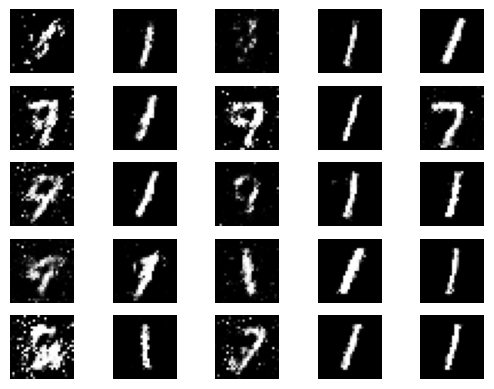

2/2 [==============================] - 0s 3ms/step
7000 [D loss: 0.305123, acc.: 87.50%] [G loss: -0.112481]
1/1 [==============================] - 0s 45ms/step


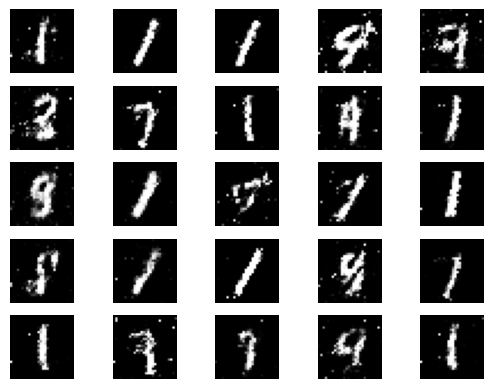

2/2 [==============================] - 0s 3ms/step
7100 [D loss: 0.261241, acc.: 90.62%] [G loss: -0.086706]
1/1 [==============================] - 0s 23ms/step


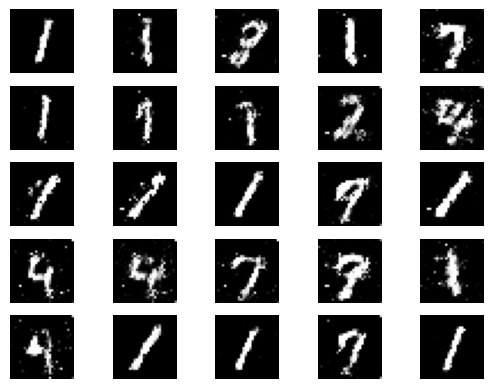

2/2 [==============================] - 0s 3ms/step
7200 [D loss: 0.286263, acc.: 89.84%] [G loss: -0.100068]
1/1 [==============================] - 0s 29ms/step


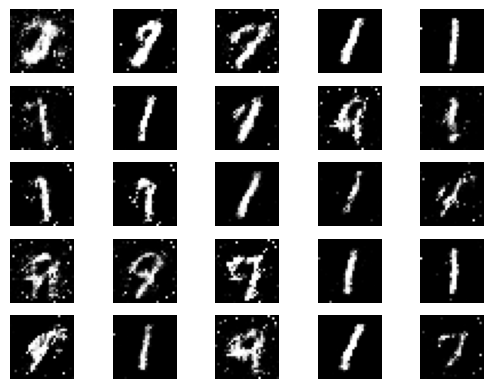

2/2 [==============================] - 0s 4ms/step
7300 [D loss: 0.133345, acc.: 96.88%] [G loss: -0.072244]
1/1 [==============================] - 0s 24ms/step


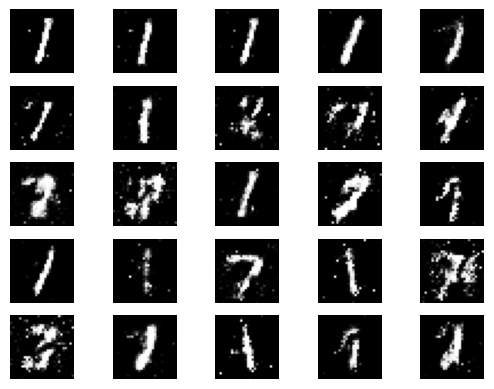

2/2 [==============================] - 0s 5ms/step
7400 [D loss: 0.267136, acc.: 89.84%] [G loss: -0.085677]
1/1 [==============================] - 0s 28ms/step


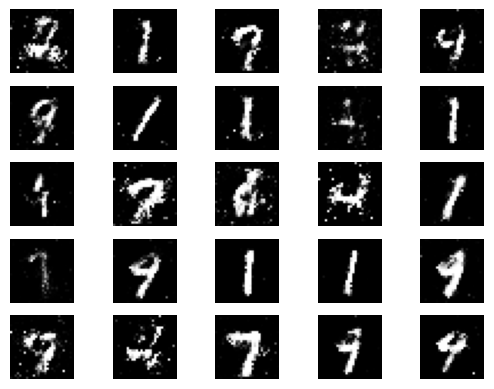

2/2 [==============================] - 0s 3ms/step
7500 [D loss: 0.239494, acc.: 91.41%] [G loss: -0.133310]
1/1 [==============================] - 0s 32ms/step


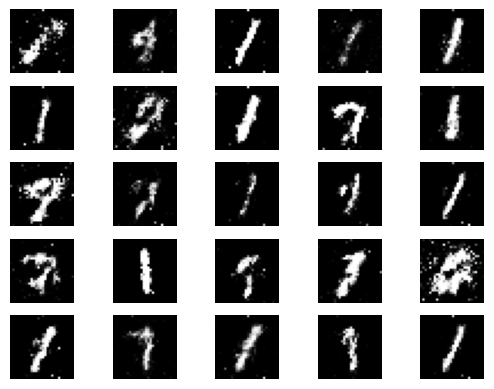

2/2 [==============================] - 0s 3ms/step
7600 [D loss: 0.175391, acc.: 92.97%] [G loss: -0.086272]
1/1 [==============================] - 0s 29ms/step


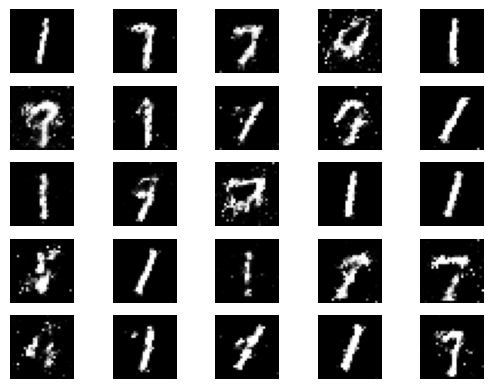

2/2 [==============================] - 0s 4ms/step
7700 [D loss: 0.232564, acc.: 91.41%] [G loss: -0.095005]
1/1 [==============================] - 0s 48ms/step


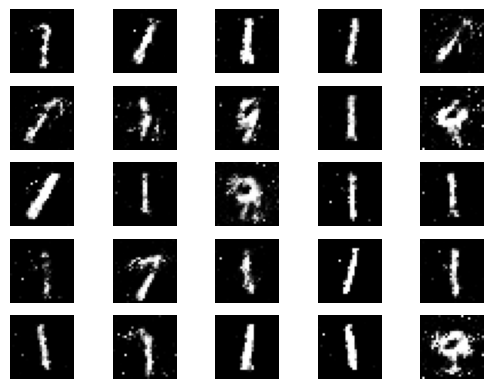

2/2 [==============================] - 0s 6ms/step
7800 [D loss: 0.179246, acc.: 93.75%] [G loss: -0.133896]
1/1 [==============================] - 0s 23ms/step


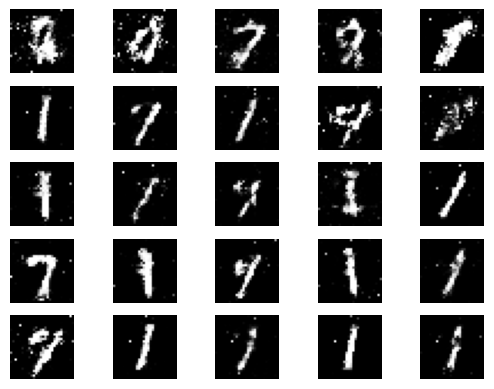

2/2 [==============================] - 0s 6ms/step
7900 [D loss: 0.354213, acc.: 83.59%] [G loss: -0.110583]
1/1 [==============================] - 0s 41ms/step


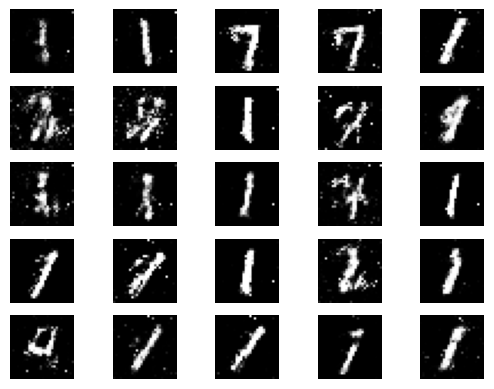

2/2 [==============================] - 0s 4ms/step
8000 [D loss: 0.198996, acc.: 93.75%] [G loss: -0.085919]
1/1 [==============================] - 0s 27ms/step


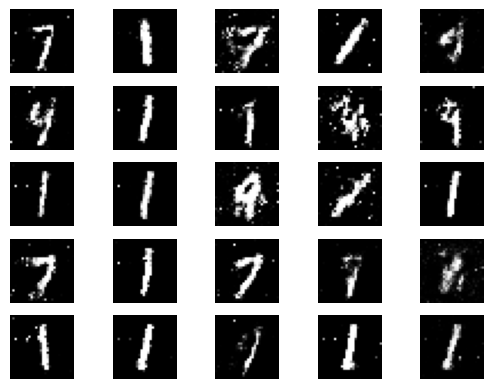

2/2 [==============================] - 0s 3ms/step
8100 [D loss: 0.234155, acc.: 91.41%] [G loss: -0.117932]
1/1 [==============================] - 0s 41ms/step


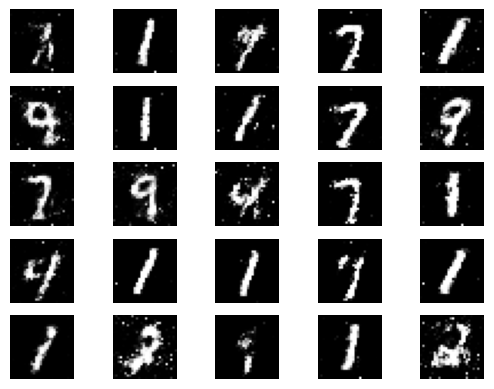

2/2 [==============================] - 0s 3ms/step
8200 [D loss: 0.303774, acc.: 86.72%] [G loss: -0.141554]
1/1 [==============================] - 0s 24ms/step


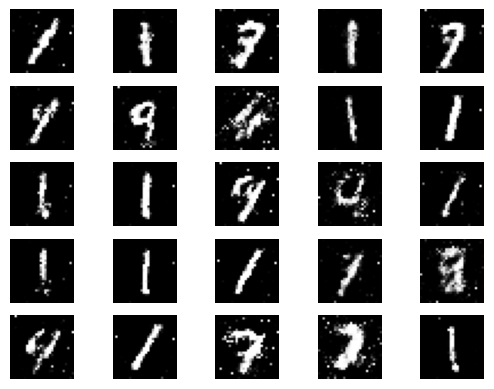

2/2 [==============================] - 0s 3ms/step
8300 [D loss: 0.167565, acc.: 94.53%] [G loss: -0.092358]
1/1 [==============================] - 0s 25ms/step


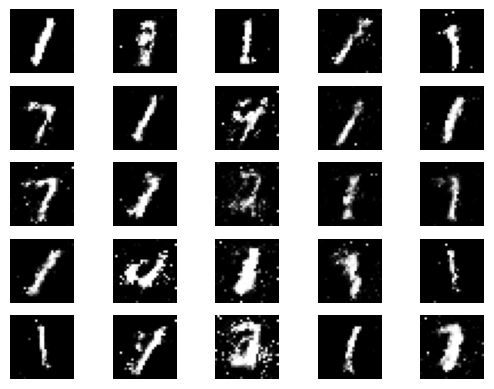

2/2 [==============================] - 0s 6ms/step
8400 [D loss: 0.257239, acc.: 90.62%] [G loss: -0.156486]
1/1 [==============================] - 0s 22ms/step


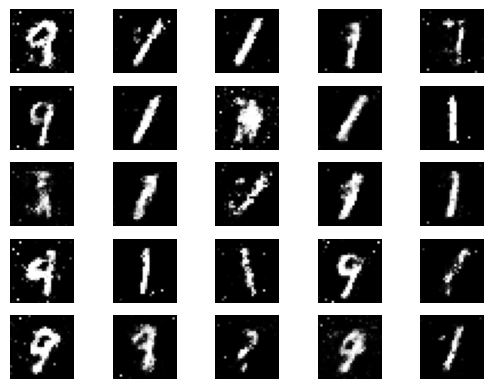

2/2 [==============================] - 0s 5ms/step
8500 [D loss: 0.211065, acc.: 92.19%] [G loss: -0.121544]
1/1 [==============================] - 0s 31ms/step


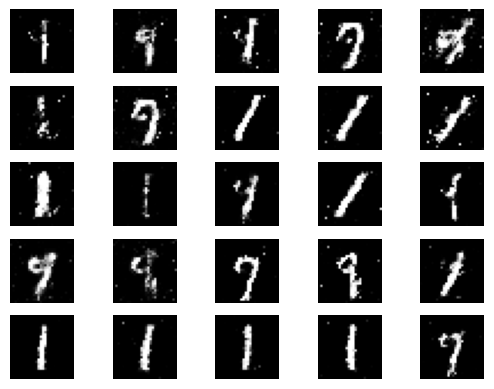

2/2 [==============================] - 0s 4ms/step
8600 [D loss: 0.222466, acc.: 92.19%] [G loss: -0.084314]
1/1 [==============================] - 0s 29ms/step


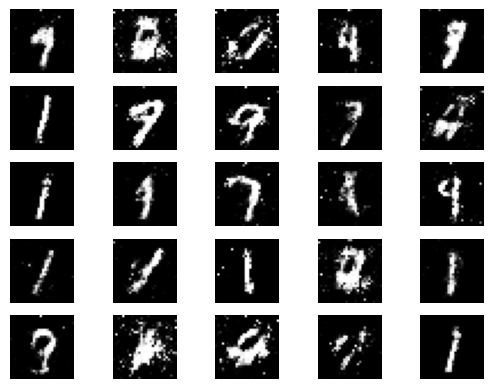

2/2 [==============================] - 0s 3ms/step
8700 [D loss: 0.294012, acc.: 89.06%] [G loss: -0.136864]
1/1 [==============================] - 0s 30ms/step


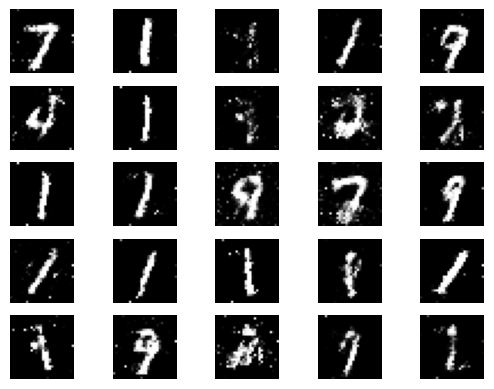

2/2 [==============================] - 0s 3ms/step
8800 [D loss: 0.286621, acc.: 89.84%] [G loss: -0.108660]
1/1 [==============================] - 0s 29ms/step


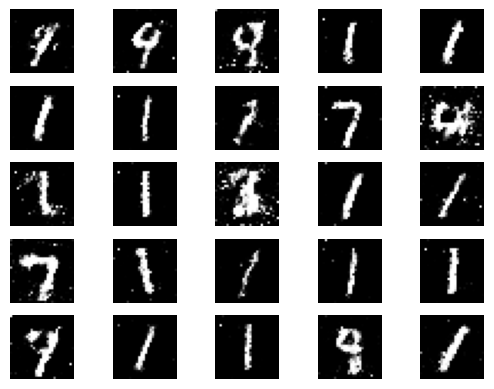

2/2 [==============================] - 0s 3ms/step
8900 [D loss: 0.173531, acc.: 92.97%] [G loss: -0.107396]
1/1 [==============================] - 0s 26ms/step


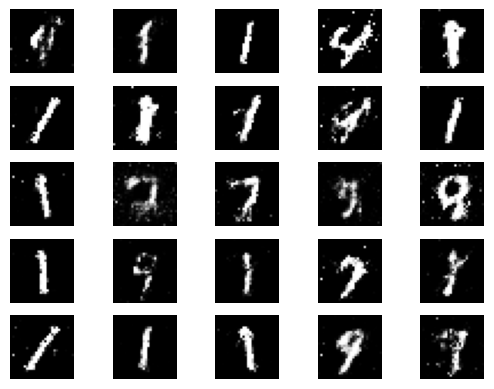

2/2 [==============================] - 0s 3ms/step
9000 [D loss: 0.279625, acc.: 85.16%] [G loss: -0.098569]
1/1 [==============================] - 0s 25ms/step


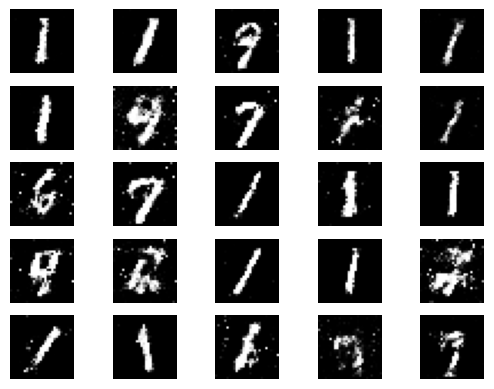

2/2 [==============================] - 0s 4ms/step
9100 [D loss: 0.259997, acc.: 87.50%] [G loss: -0.118260]
1/1 [==============================] - 0s 30ms/step


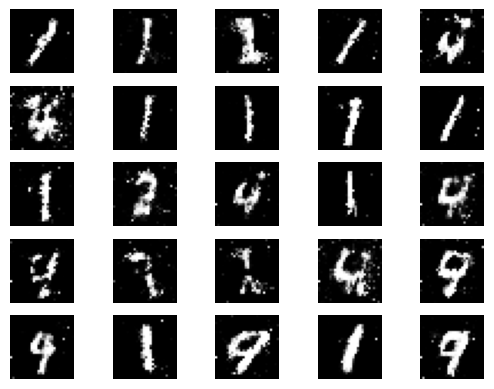

2/2 [==============================] - 0s 3ms/step
9200 [D loss: 0.197927, acc.: 92.19%] [G loss: -0.097065]
1/1 [==============================] - 0s 27ms/step


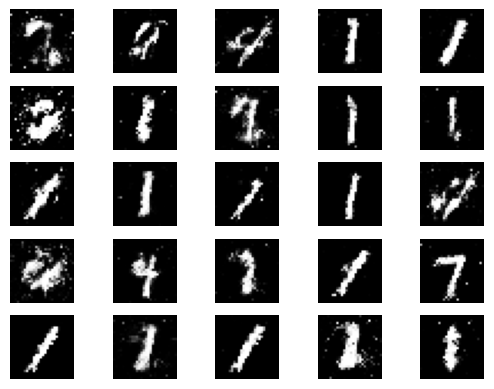

2/2 [==============================] - 0s 7ms/step
9300 [D loss: 0.213655, acc.: 89.84%] [G loss: -0.091511]
1/1 [==============================] - 0s 59ms/step


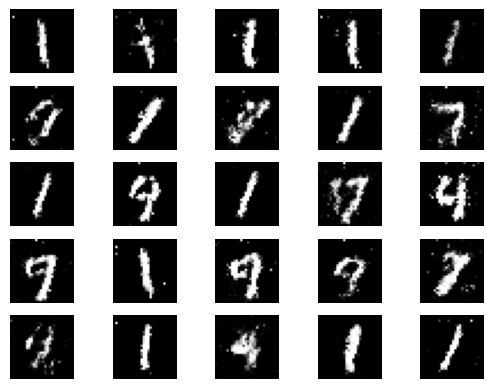

2/2 [==============================] - 0s 6ms/step
9400 [D loss: 0.194620, acc.: 93.75%] [G loss: -0.106787]
1/1 [==============================] - 0s 30ms/step


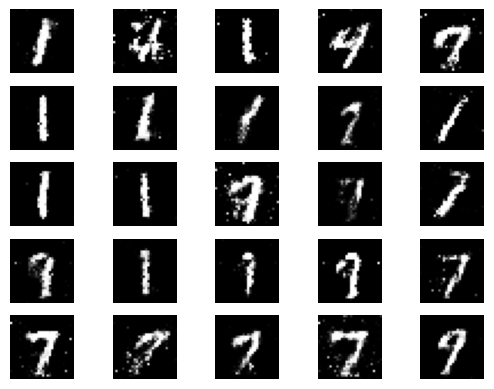

2/2 [==============================] - 0s 3ms/step
9500 [D loss: 0.223266, acc.: 90.62%] [G loss: -0.170416]
1/1 [==============================] - 0s 24ms/step


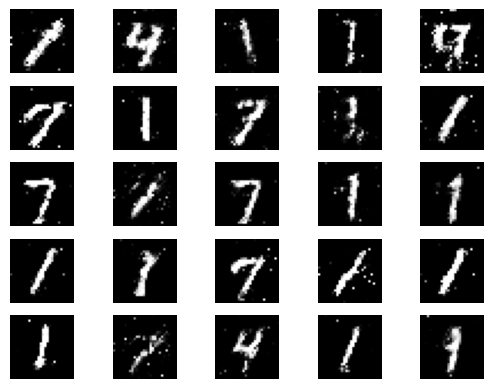

2/2 [==============================] - 0s 3ms/step
9600 [D loss: 0.238614, acc.: 89.06%] [G loss: -0.144308]
1/1 [==============================] - 0s 23ms/step


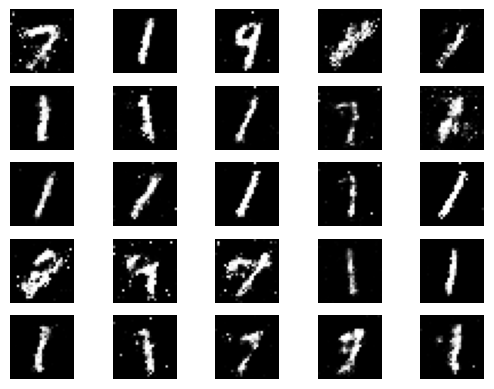

2/2 [==============================] - 0s 3ms/step
9700 [D loss: 0.197226, acc.: 92.19%] [G loss: -0.105840]
1/1 [==============================] - 0s 23ms/step


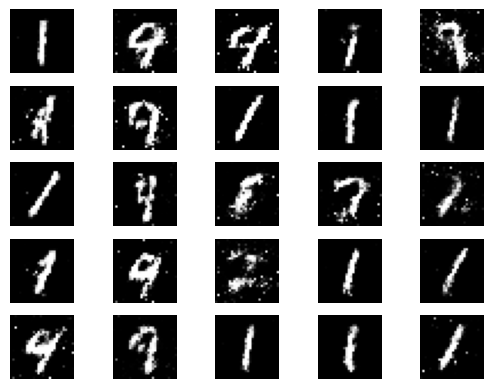

2/2 [==============================] - 0s 3ms/step
9800 [D loss: 0.226347, acc.: 92.19%] [G loss: -0.113395]
1/1 [==============================] - 0s 57ms/step


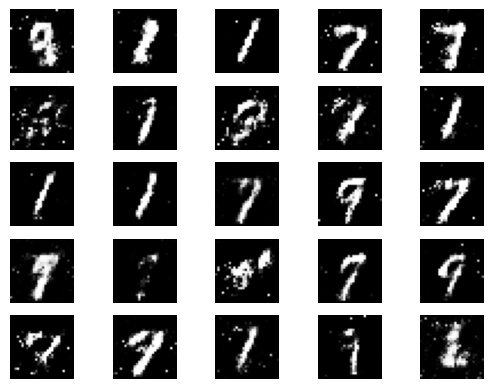

2/2 [==============================] - 0s 6ms/step
9900 [D loss: 0.201520, acc.: 93.75%] [G loss: -0.088701]
1/1 [==============================] - 0s 25ms/step


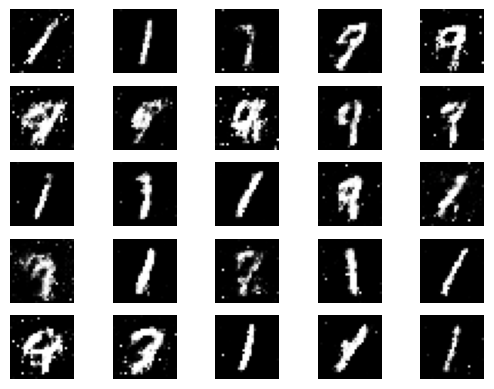

2/2 [==============================] - 0s 6ms/step


In [14]:
# parameters for training
batch_size=64
n_iters_outer=10000
sample_interval=100
n_iters_inner=1	#number of internal loops

#load dataset
X_train = load_data(dataset_name)

# Adversarial ground truths
d_output_true = np.ones((batch_size,))  #FILL IN CODE
d_output_false = np.zeros((batch_size,)) #FILL IN CODE

# start training 
for iter_outer in range(0,n_iters_outer):

  # ---------------------
  #  Train Discriminator
  # ---------------------

  # Train the discriminator
  for iter_inner in range(0,n_iters_inner):
    # Select a random batch of images
    idx = np.random.randint(0, X_train.shape[0], batch_size)
    imgs = X_train[idx]

    z_random = np.random.normal(0, 1, (batch_size, z_dim))

    # Generate a batch of new (fake) images
    gen_imgs = generator.predict(z_random)
    
    d_loss_real = discriminator.train_on_batch(imgs, d_output_true)  # FILL IN CODE
    d_loss_fake = discriminator.train_on_batch(gen_imgs, d_output_false) # FILL IN CODE
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
  
  # ---------------------
  #  Train Generator
  # ---------------------

  # Select a random batch of images
  idx = np.random.randint(0, X_train.shape[0], batch_size)
  imgs = X_train[idx]

  z_random = np.random.normal(0, 1, (batch_size, z_dim))

  # Generate a batch of new (fake) images
  gen_imgs = generator.predict(z_random) # FILL IN CODE
  # Generator training : try to make generated images be classified as true by the discriminator
  g_loss = stacked_gen_disc.train_on_batch(z_random,None)

  # Save some random generated images and the models at every sample_interval iterations
  if (iter_outer % sample_interval == 0):
    print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (iter_outer, d_loss[0], 100*d_loss[1], g_loss))
    sample_images(generator,z_dim, rand_seed=30)

# Training on CIFAR

Use the above code and modify it to carry out the GAN training on the CIFAR10 database.

For this case, implement the following architecture :

- Generator :
  - Dense layer to size 1024
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Reshape, to size $4 \times 4 \times64$
  - % size = $4\times4\times64$
  - Conv2DTranspose, filters=16,kernel size=(5,5), strides=(2,2),padding=same
  - %size = $8\times 8\times 16$
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Conv2DTranspose, filters=16,kernel size=(4,4), strides=(2,2),padding=same
  - %size=$16 \times 16 \times 16$
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Conv2DTranspose, filters=32,kernel size=(5,5), strides=(2,2),padding=same
  - %size = $32 \times 32 \times 32$
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Conv2DTranspose, filters=3,kernel size=(5,5), strides=(2,2),padding=same
  - %size = $32 \times 32 \times 3$
  - Tanh activation ( you can use ```Activation('tanh')```)

- Discriminator :
  - % input size : $32 \times 32 \times 3$
  - Conv2D, 32 filters, kernel size = (3,3), strides = (1,1),padding = same
  - % size $32 \times 32 \times 32$
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Conv2D, 32 filters, kernel size = (3,3), strides = (2,2),padding = same
  - %size : $16 \times 16 \times 32$
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Conv2D, 64 filters, kernel size = (3,3), strides = (2,2),padding = same
  - % size : $8 \times 8 \times 64$
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Conv2D, 32 filters, kernel size = (3,3), strides = (2,2),padding = same
  - % size : $4 \times 4 \times 32$
  - BatchNormalization, momentum=0.8
  - Leaky ReLU ($\alpha=0.2$)
  - Flatten
  - Dense layer, to size 1
  - Sigmoid activation

  Implement this architecture below, and train the GAN. __Do not worry about the quality of the output images__, to get good results, longer training is usually required.

In [15]:
def build_generator_cifar(z_dim,img_shape,dataset_name):

  model_generator=Sequential()
  z_rand = Input(shape=(z_dim,))
  
  model_generator.add(z_rand)
  model_generator.add(Dense(1024))
  #model_generator.add(BatchNormalization(momentum=0.8))
  model_generator.add(LeakyReLU(0.2))
  model_generator.add(Reshape((4,4,64)))
  model_generator.add(Conv2DTranspose(filters=16,kernel_size=(5,5),strides=(2,2),padding='same'))
  #model_generator.add(BatchNormalization(momentum=0.8))
  model_generator.add(LeakyReLU(0.2))
  model_generator.add(Conv2DTranspose(filters=16,kernel_size=(4,4),strides=(2,2),padding='same'))
  #model_generator.add(BatchNormalization(momentum=0.8))
  model_generator.add(LeakyReLU(0.2))
  model_generator.add(Conv2DTranspose(filters=32,kernel_size=(5,5),strides=(2,2),padding='same'))
  #model_generator.add(BatchNormalization(momentum=0.8))
  model_generator.add(LeakyReLU(0.2))
  model_generator.add(Conv2D(filters=3,kernel_size=(5,5),strides=(1,1),padding='same'))
  model_generator.add(Activation('tanh'))

  model_generator.summary()

  return model_generator

In [16]:
def build_discriminator_cifar(img_shape,dataset_name):

  input_img = Input(shape=img_shape)
	
  model_discriminator=Sequential()
  model_discriminator.add(input_img)
  model_discriminator.add(Conv2D(filters=32,kernel_size=(3,3),strides=(1,1),padding='same'))
  #model_discriminator.add(BatchNormalization(momentum=0.8))
  model_discriminator.add(LeakyReLU(0.2))
  model_discriminator.add(Conv2D(filters=32,kernel_size=(3,3),strides=(2,2),padding='same'))
  #model_discriminator.add(BatchNormalization(momentum=0.8))
  model_discriminator.add(LeakyReLU(0.2))
  model_discriminator.add(Conv2D(filters=64,kernel_size=(3,3),strides=(2,2),padding='same'))
  #model_discriminator.add(BatchNormalization(momentum=0.8))
  model_discriminator.add(LeakyReLU(0.2))
  model_discriminator.add(Conv2D(filters=32,kernel_size=(3,3),strides=(2,2),padding='same'))
  #model_discriminator.add(BatchNormalization(momentum=0.8))
  model_discriminator.add(LeakyReLU(0.2))
  model_discriminator.add(Flatten())
  model_discriminator.add(Dense(1))
  model_discriminator.add(Activation('sigmoid'))

  model_discriminator.summary()

  return model_discriminator

In [17]:
optimizer = Adam(0.0001, 0.9)
dataset_name = 'cifar'
X_train = load_data(dataset_name)

# default parameters for mnist 
img_rows = X_train.shape[1]
img_cols = X_train.shape[2]
img_channels = X_train.shape[3]
img_shape = (img_rows, img_cols, img_channels)
z_dim = 10

# Build and compile the discriminator
discriminator = build_discriminator_cifar(img_shape,dataset_name)
# set discriminator loss
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy']) # FILL IN CODE

# Build the generator
generator = build_generator_cifar(z_dim,img_shape,dataset_name)

# Create the stacked model
#first, create the random vector z in the latent space
z = Input(shape=(z_dim,))
#create generated (fake) image
gen_img = generator(z)  # FILL IN CODE

#indicate that for the stacked model, the weights are not trained (we only train the generator in the stacked model)
discriminator.trainable = False

# The discriminator takes generated images as input and gives a probability of whether it is a true or false image
p_true = discriminator(gen_img)  # FILL IN CODE

# The combined model  (stacked generator and discriminator)
# In this model, we train the generator only
stacked_gen_disc = Model(z, p_true)

# generator loss
generator_loss = K.mean(K.log(1-discriminator(generator(z))))  # FILL IN CODE
# create stacked model loss
stacked_gen_disc.add_loss(generator_loss)
stacked_gen_disc.compile(optimizer=optimizer)

170498071/170498071 [==============================] - 3s 0us/step
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        896       
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 32)        9248      
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 16, 16, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 64)          18496     
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 8, 8, 64)          0         
                                                     

2/2 [==============================] - 0s 7ms/step
0 [D loss: 0.704012, acc.: 11.72%] [G loss: -0.693350]
1/1 [==============================] - 0s 217ms/step


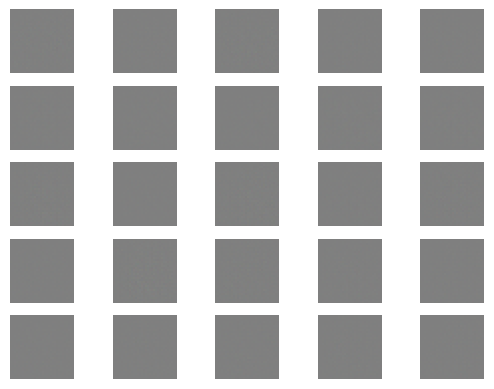

2/2 [==============================] - 0s 6ms/step
100 [D loss: 0.668680, acc.: 47.66%] [G loss: -0.955667]
1/1 [==============================] - 0s 29ms/step


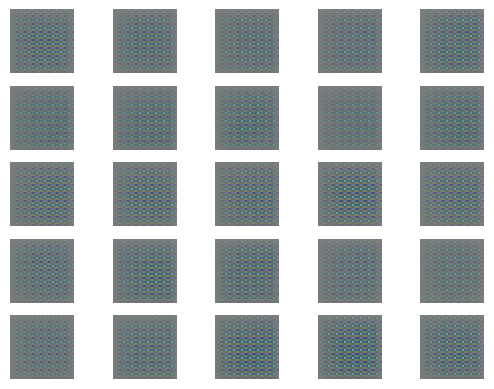

2/2 [==============================] - 0s 5ms/step
200 [D loss: 0.003863, acc.: 100.00%] [G loss: -0.001797]
1/1 [==============================] - 0s 25ms/step


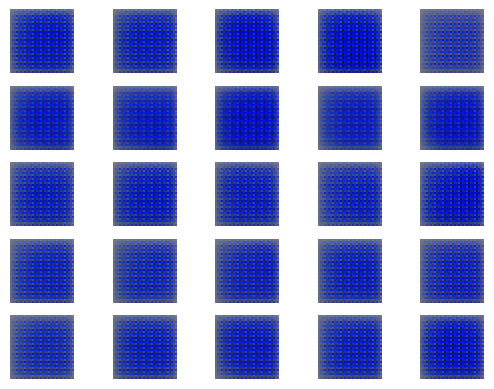

2/2 [==============================] - 0s 4ms/step
300 [D loss: 0.002485, acc.: 100.00%] [G loss: -0.000581]
1/1 [==============================] - 0s 36ms/step


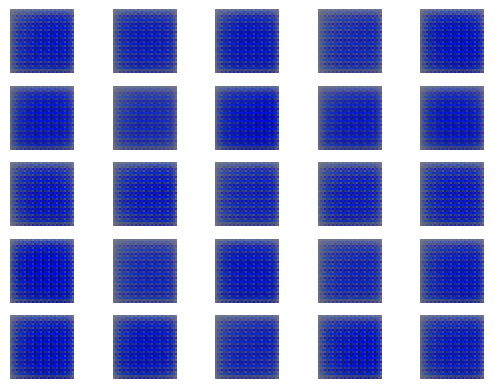

2/2 [==============================] - 0s 4ms/step
400 [D loss: 0.006755, acc.: 99.22%] [G loss: -0.000621]
1/1 [==============================] - 0s 41ms/step


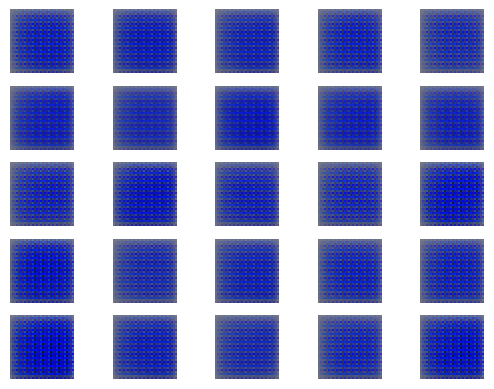

2/2 [==============================] - 0s 4ms/step
500 [D loss: 0.000147, acc.: 100.00%] [G loss: -0.000270]
1/1 [==============================] - 0s 26ms/step


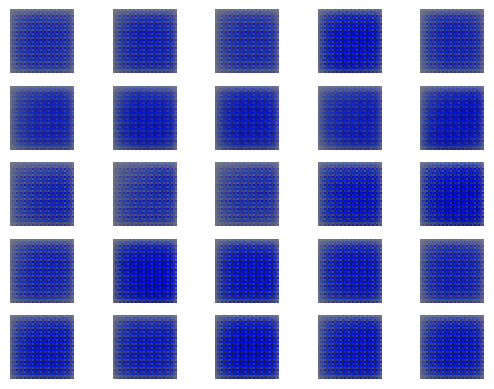

2/2 [==============================] - 0s 4ms/step
600 [D loss: 0.000539, acc.: 100.00%] [G loss: -0.000279]
1/1 [==============================] - 0s 28ms/step


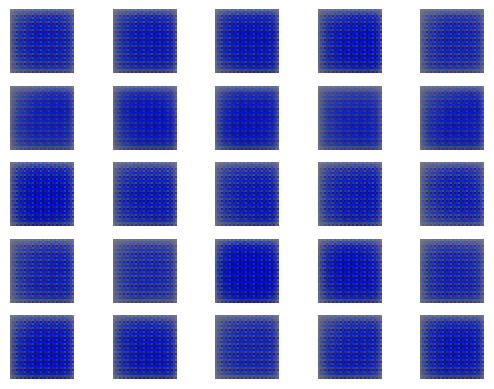

2/2 [==============================] - 0s 4ms/step
700 [D loss: 0.000131, acc.: 100.00%] [G loss: -0.000100]
1/1 [==============================] - 0s 24ms/step


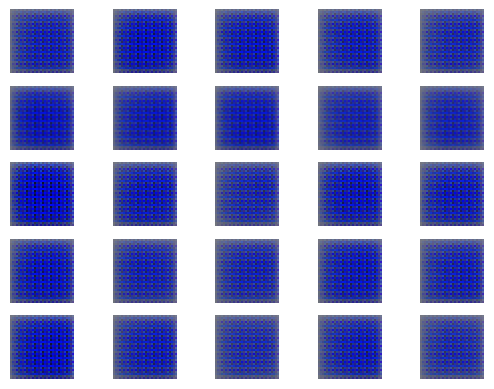

2/2 [==============================] - 0s 4ms/step
800 [D loss: 0.000146, acc.: 100.00%] [G loss: -0.000208]
1/1 [==============================] - 0s 26ms/step


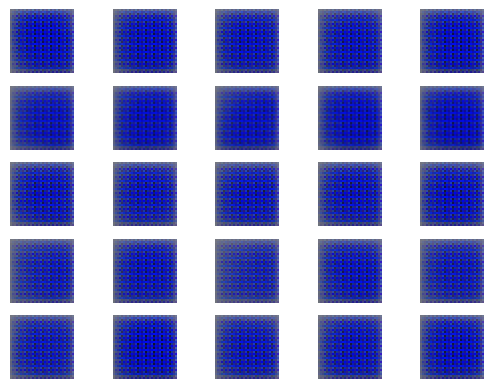

2/2 [==============================] - 0s 4ms/step
900 [D loss: 0.000204, acc.: 100.00%] [G loss: -0.000068]
1/1 [==============================] - 0s 26ms/step


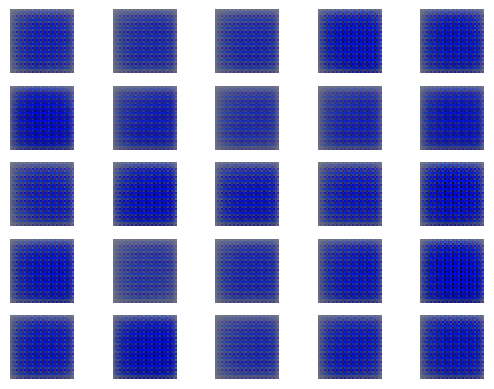

2/2 [==============================] - 0s 7ms/step
1000 [D loss: 0.000036, acc.: 100.00%] [G loss: -0.000069]
1/1 [==============================] - 0s 30ms/step


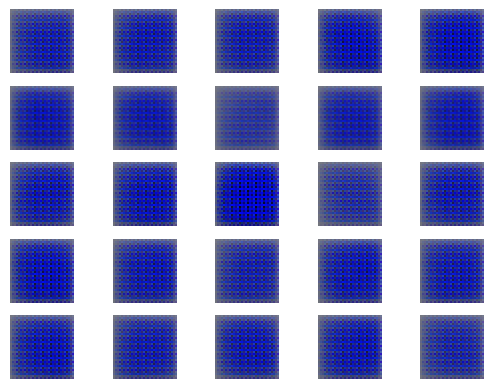

2/2 [==============================] - 0s 4ms/step
1100 [D loss: 0.000052, acc.: 100.00%] [G loss: -0.000114]
1/1 [==============================] - 0s 24ms/step


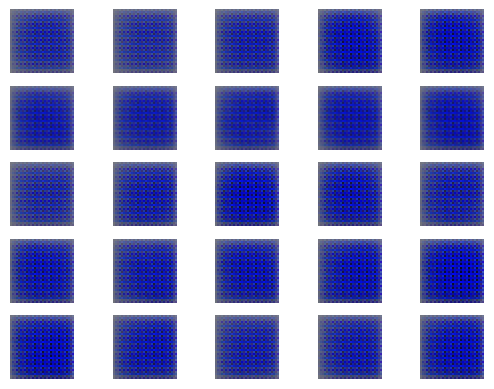

2/2 [==============================] - 0s 4ms/step
1200 [D loss: 0.000070, acc.: 100.00%] [G loss: -0.000101]
1/1 [==============================] - 0s 26ms/step


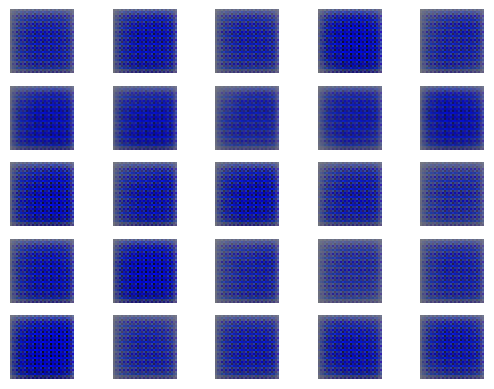

2/2 [==============================] - 0s 4ms/step
1300 [D loss: 0.000299, acc.: 100.00%] [G loss: -0.000346]
1/1 [==============================] - 0s 22ms/step


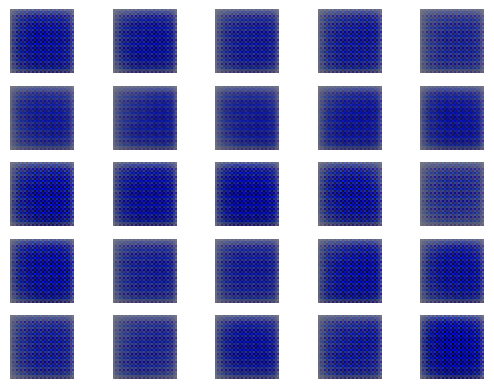

2/2 [==============================] - 0s 6ms/step
1400 [D loss: 0.045542, acc.: 99.22%] [G loss: -0.002007]
1/1 [==============================] - 0s 25ms/step


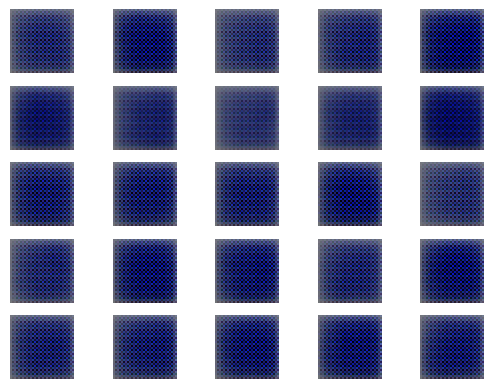

2/2 [==============================] - 0s 7ms/step
1500 [D loss: 0.008992, acc.: 100.00%] [G loss: -0.005651]
1/1 [==============================] - 0s 26ms/step


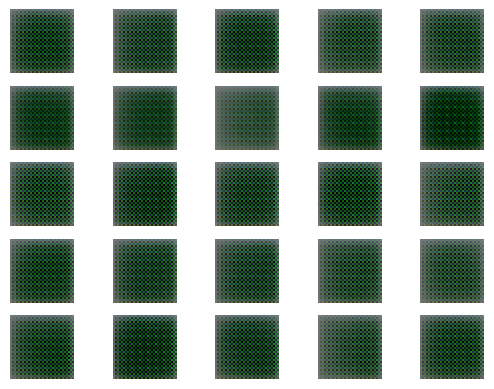

2/2 [==============================] - 0s 5ms/step
1600 [D loss: 0.020444, acc.: 99.22%] [G loss: -0.003352]
1/1 [==============================] - 0s 46ms/step


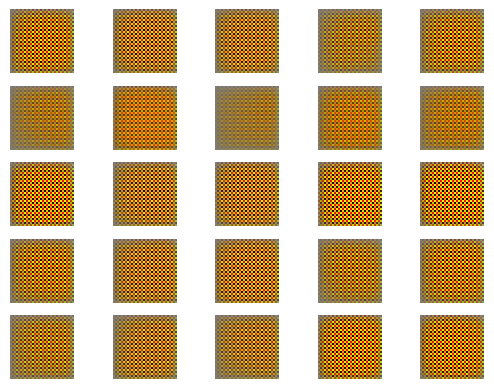

2/2 [==============================] - 0s 4ms/step
1700 [D loss: 0.008216, acc.: 100.00%] [G loss: -0.013734]
1/1 [==============================] - 0s 28ms/step


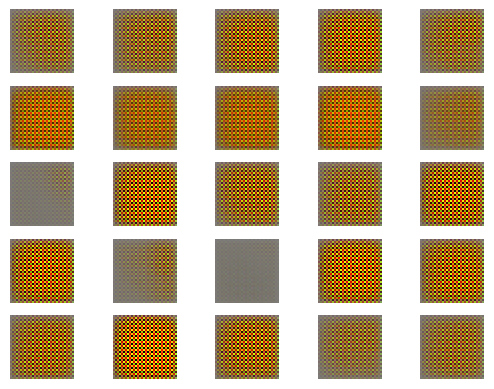

2/2 [==============================] - 0s 4ms/step
1800 [D loss: 0.024543, acc.: 99.22%] [G loss: -0.013733]
1/1 [==============================] - 0s 26ms/step


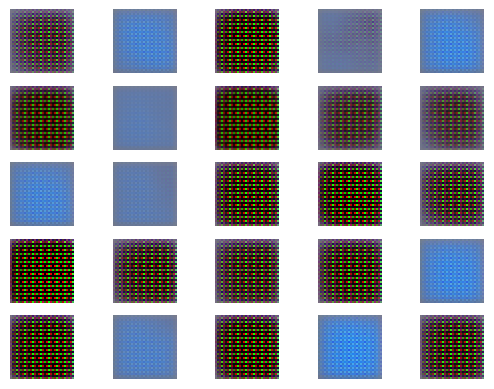

2/2 [==============================] - 0s 4ms/step
1900 [D loss: 0.160543, acc.: 95.31%] [G loss: -0.111017]
1/1 [==============================] - 0s 40ms/step


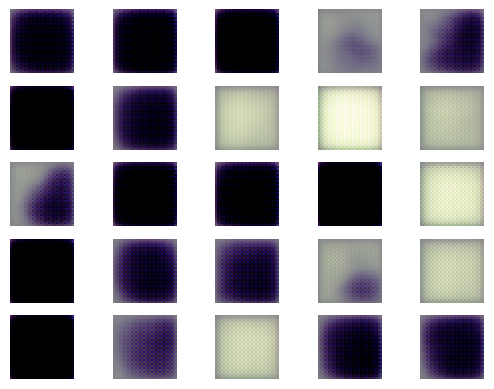

2/2 [==============================] - 0s 6ms/step
2000 [D loss: 0.091462, acc.: 95.31%] [G loss: -0.086715]
1/1 [==============================] - 0s 29ms/step


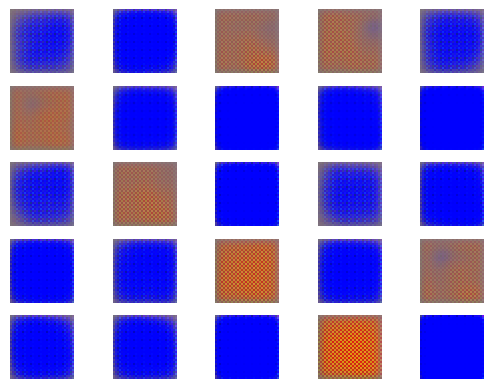

2/2 [==============================] - 0s 4ms/step
2100 [D loss: 0.049408, acc.: 98.44%] [G loss: -0.025494]
1/1 [==============================] - 0s 24ms/step


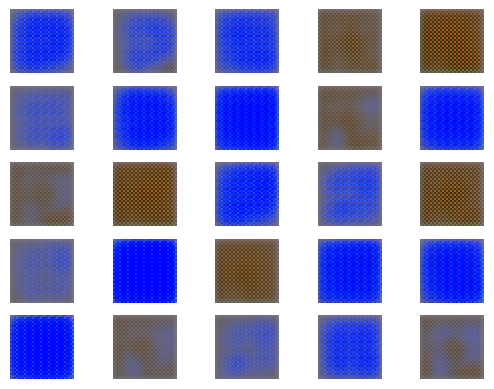

2/2 [==============================] - 0s 4ms/step
2200 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 25ms/step


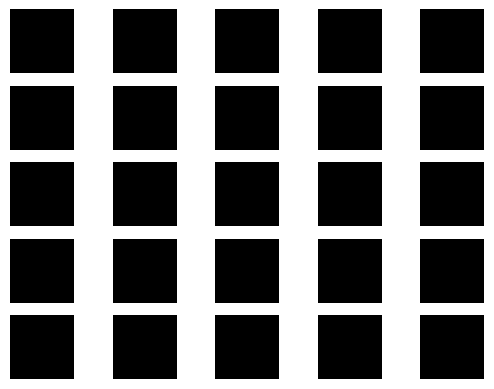

2/2 [==============================] - 0s 8ms/step
2300 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 36ms/step


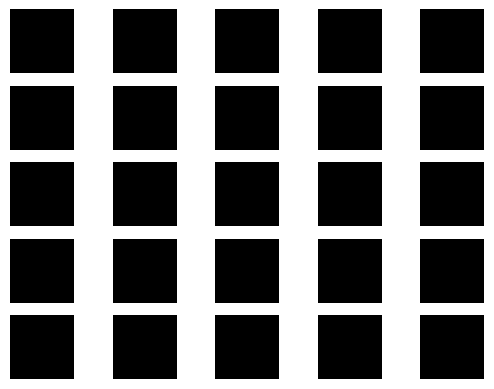

2/2 [==============================] - 0s 7ms/step
2400 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 28ms/step


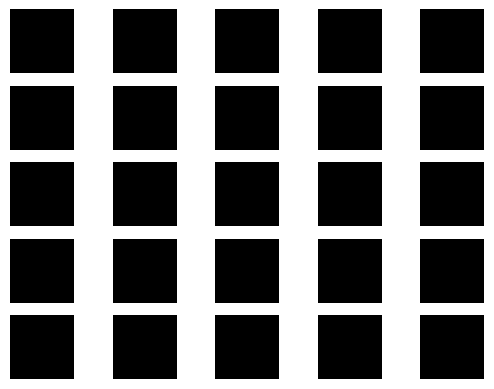

2/2 [==============================] - 0s 4ms/step
2500 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 28ms/step


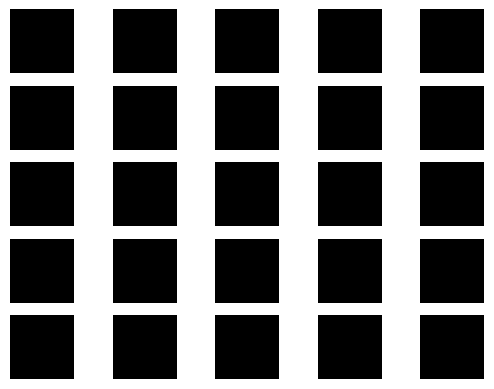

2/2 [==============================] - 0s 7ms/step
2600 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 29ms/step


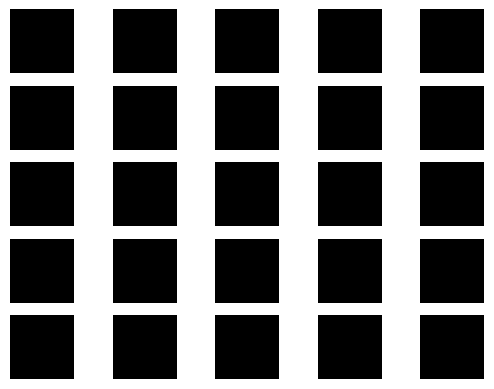

2/2 [==============================] - 0s 4ms/step
2700 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 29ms/step


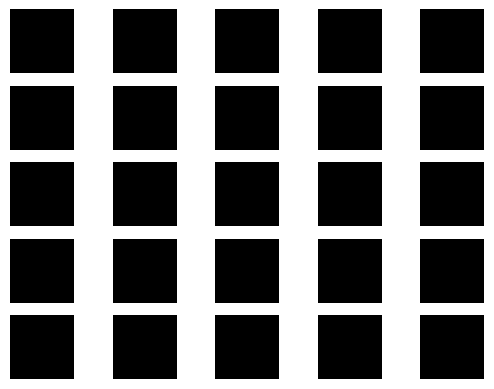

2/2 [==============================] - 0s 8ms/step
2800 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 34ms/step


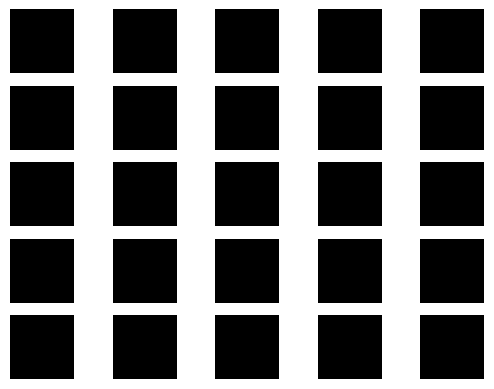

2/2 [==============================] - 0s 4ms/step
2900 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 28ms/step


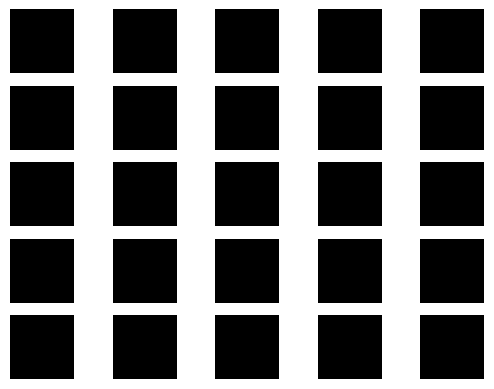

2/2 [==============================] - 0s 4ms/step
3000 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 26ms/step


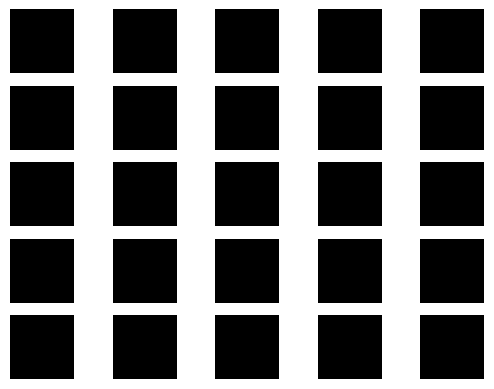

2/2 [==============================] - 0s 7ms/step
3100 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 28ms/step


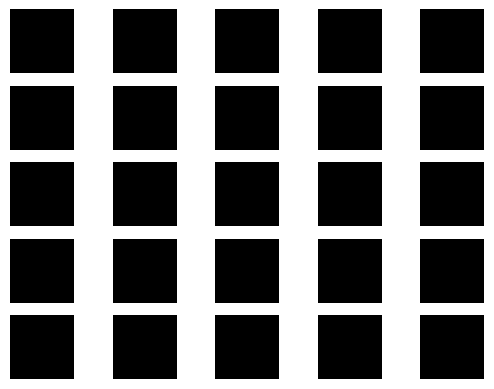

2/2 [==============================] - 0s 8ms/step
3200 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 55ms/step


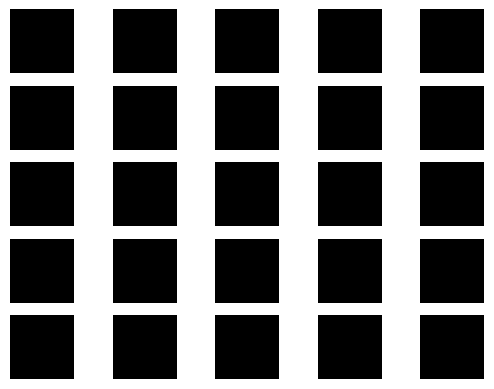

2/2 [==============================] - 0s 4ms/step
3300 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 28ms/step


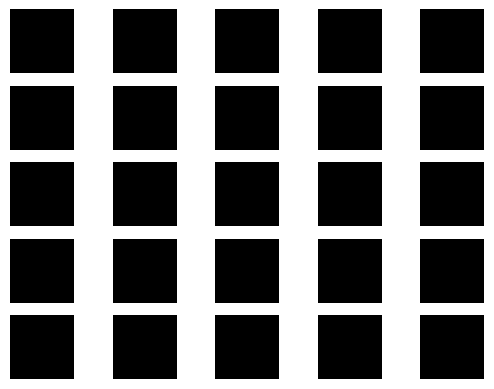

2/2 [==============================] - 0s 7ms/step
3400 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 24ms/step


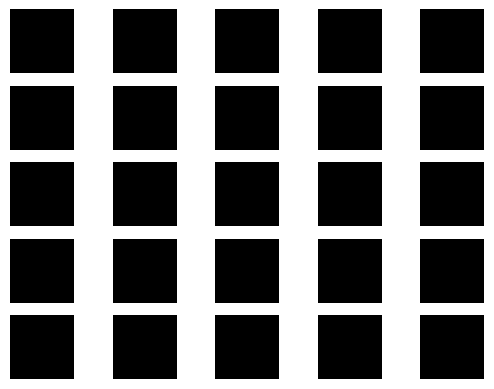

2/2 [==============================] - 0s 7ms/step
3500 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 30ms/step


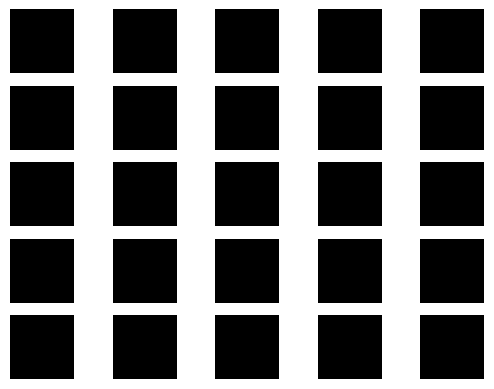

2/2 [==============================] - 0s 4ms/step
3600 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 30ms/step


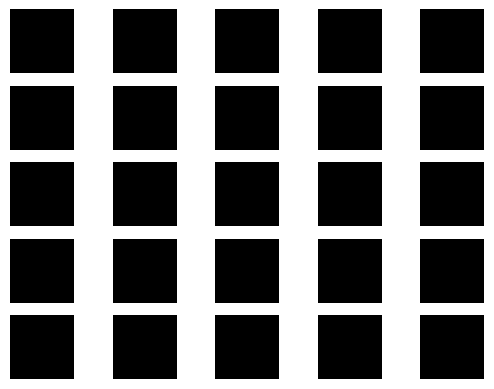

2/2 [==============================] - 0s 4ms/step
3700 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 23ms/step


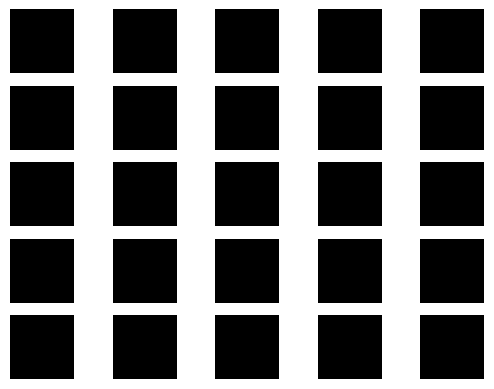

2/2 [==============================] - 0s 8ms/step
3800 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 55ms/step


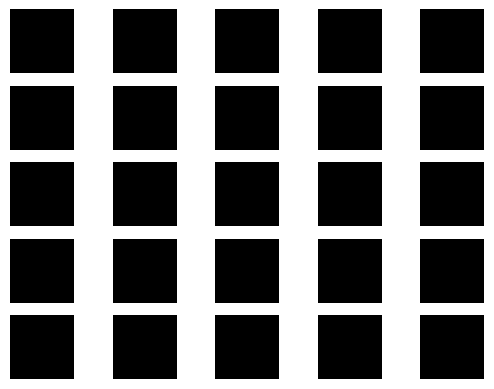

2/2 [==============================] - 0s 7ms/step
3900 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 23ms/step


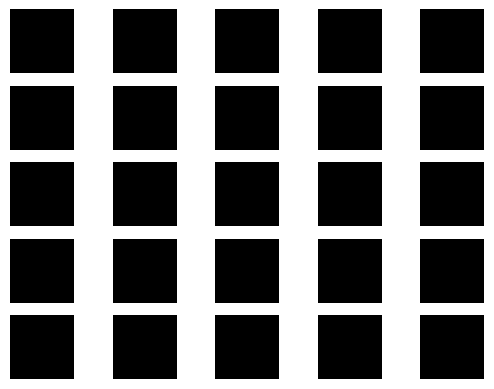

2/2 [==============================] - 0s 8ms/step
4000 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 26ms/step


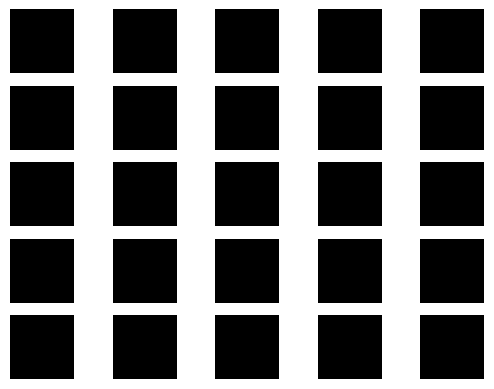

2/2 [==============================] - 0s 4ms/step
4100 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 25ms/step


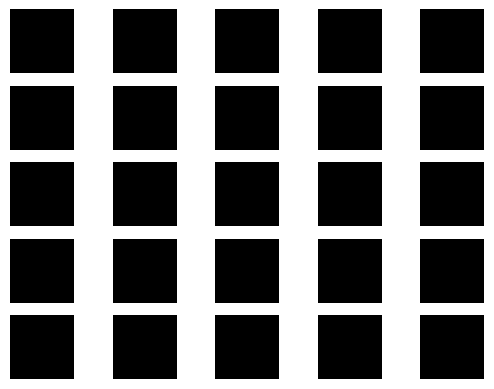

2/2 [==============================] - 0s 4ms/step
4200 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 27ms/step


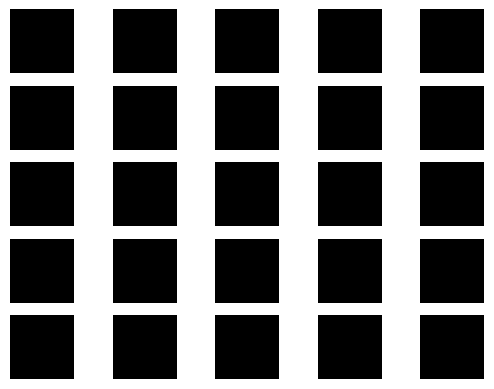

2/2 [==============================] - 0s 4ms/step
4300 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 27ms/step


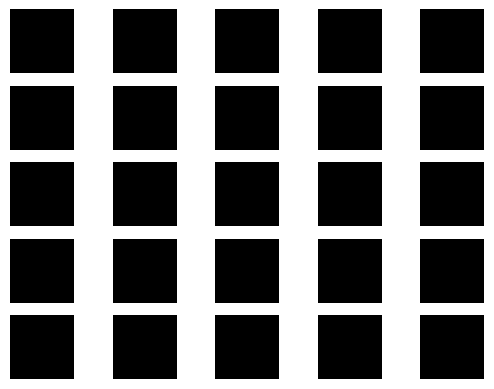

2/2 [==============================] - 0s 10ms/step
4400 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 34ms/step


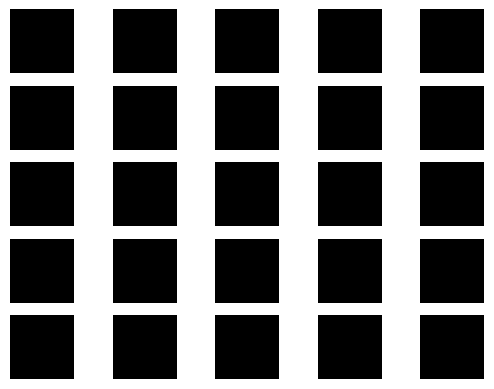

2/2 [==============================] - 0s 8ms/step
4500 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 29ms/step


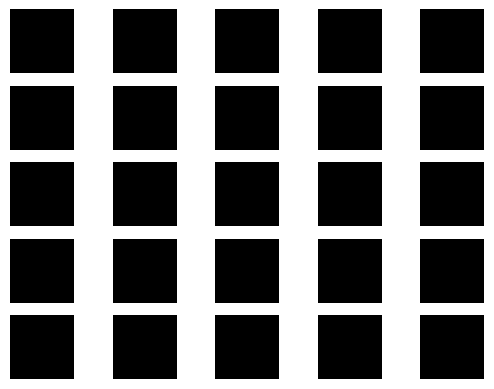

2/2 [==============================] - 0s 4ms/step
4600 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 31ms/step


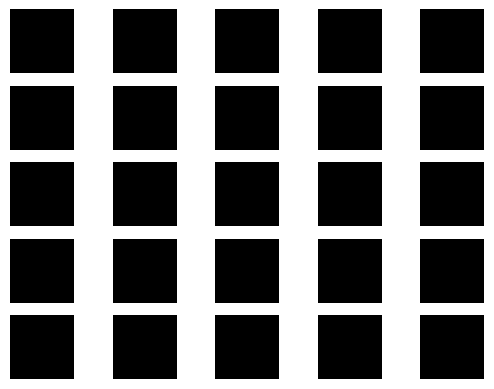

2/2 [==============================] - 0s 4ms/step
4700 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 29ms/step


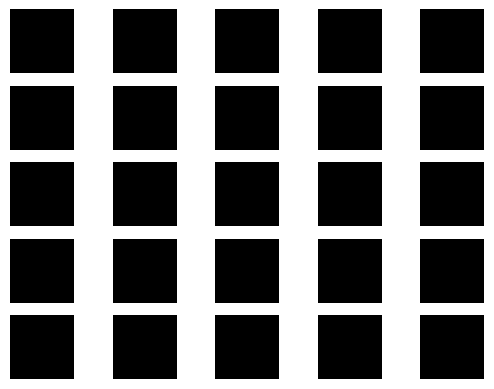

2/2 [==============================] - 0s 4ms/step
4800 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 25ms/step


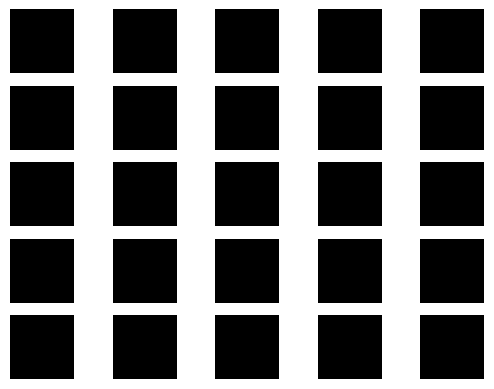

2/2 [==============================] - 0s 9ms/step
4900 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 30ms/step


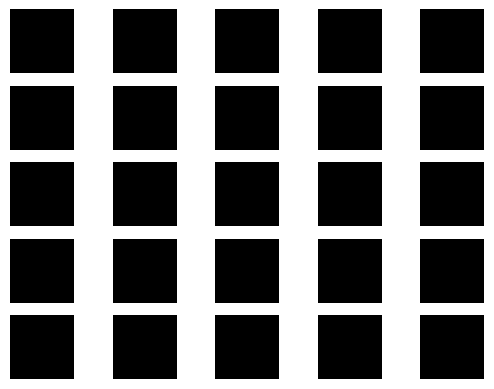

2/2 [==============================] - 0s 4ms/step
5000 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 23ms/step


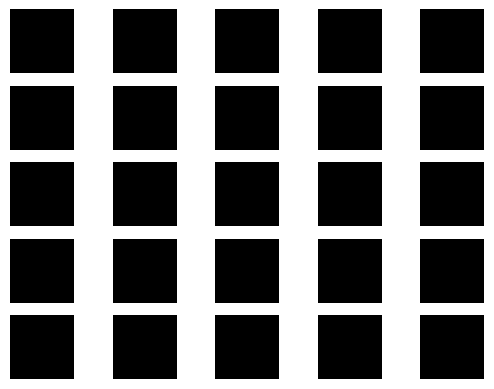

2/2 [==============================] - 0s 7ms/step
5100 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 24ms/step


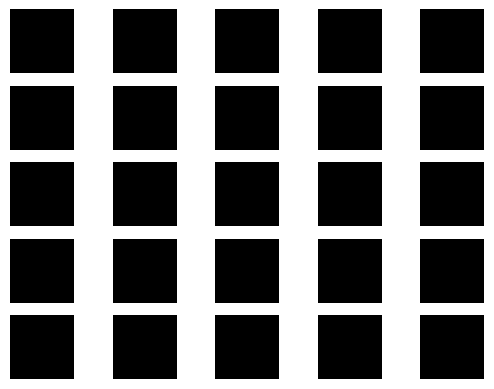

2/2 [==============================] - 0s 4ms/step
5200 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 33ms/step


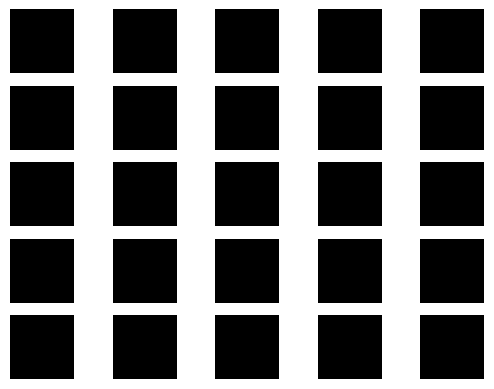

2/2 [==============================] - 0s 8ms/step
5300 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 26ms/step


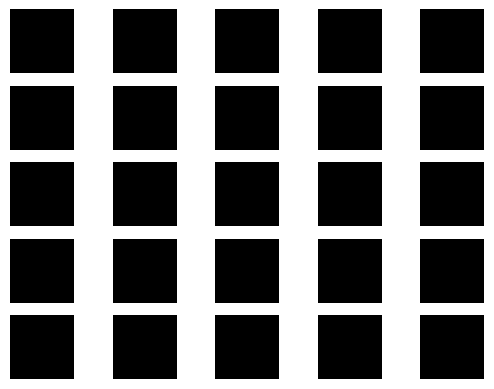

2/2 [==============================] - 0s 4ms/step
5400 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 23ms/step


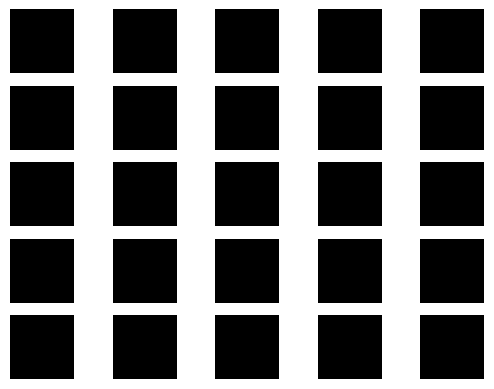

2/2 [==============================] - 0s 9ms/step
5500 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 27ms/step


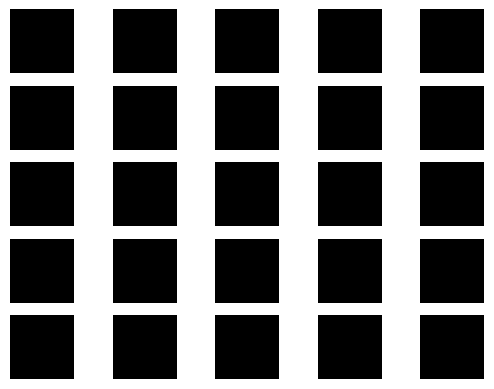

2/2 [==============================] - 0s 4ms/step
5600 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 31ms/step


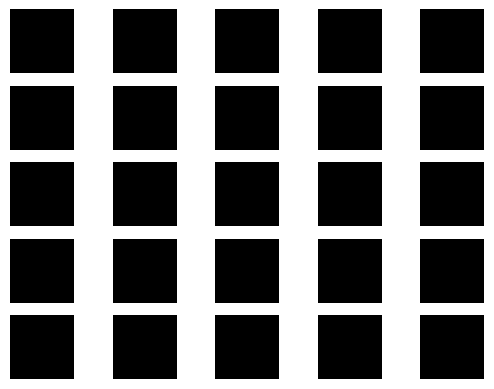

2/2 [==============================] - 0s 6ms/step
5700 [D loss: nan, acc.: 50.00%] [G loss: nan]
1/1 [==============================] - 0s 54ms/step


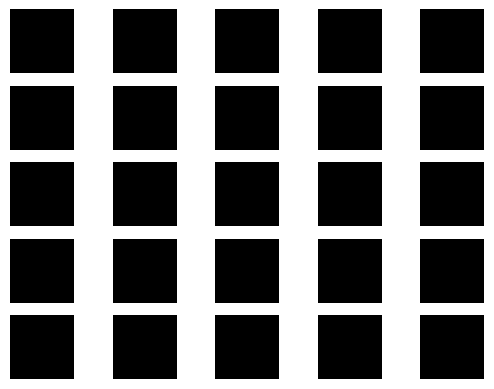

1/2 [==============>...............] - ETA: 0s

In [ ]:
# parameters for training
batch_size=64
n_iters_outer=10000
sample_interval=100
n_iters_inner=1	#number of internal loops

#load dataset
X_train = load_data(dataset_name)

# Adversarial ground truths
d_output_true = np.ones((batch_size,))  #FILL IN CODE
d_output_false = np.zeros((batch_size,)) #FILL IN CODE

# start training 
for iter_outer in range(0,n_iters_outer):

  # ---------------------
  #  Train Discriminator
  # ---------------------

  # Train the discriminator
  for iter_inner in range(0,n_iters_inner):
    # Select a random batch of images
    idx = np.random.randint(0, X_train.shape[0], batch_size)
    imgs = X_train[idx]

    z_random = np.random.normal(0, 1, (batch_size, z_dim))

    # Generate a batch of new (fake) images
    gen_imgs = generator.predict(z_random)
    
    d_loss_real = discriminator.train_on_batch(imgs, d_output_true)  # FILL IN CODE
    d_loss_fake = discriminator.train_on_batch(gen_imgs, d_output_false) # FILL IN CODE
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
  
  # ---------------------
  #  Train Generator
  # ---------------------

  # Select a random batch of images
  idx = np.random.randint(0, X_train.shape[0], batch_size)
  imgs = X_train[idx]

  z_random = np.random.normal(0, 1, (batch_size, z_dim))

  # Generate a batch of new (fake) images
  gen_imgs = generator.predict(z_random) # FILL IN CODE
  # Generator training : try to make generated images be classified as true by the discriminator
  g_loss = stacked_gen_disc.train_on_batch(z_random,None)

  # Save some random generated images and the models at every sample_interval iterations
  if (iter_outer % sample_interval == 0):
    print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (iter_outer, d_loss[0], 100*d_loss[1], g_loss))
    sample_images(generator,z_dim, rand_seed=30)

The same architecture trained on CIFAR10 appears to have suffered mode collapse.